# Visual Odometry for Localization in Autonomous Driving

Welcome to the assignment for Module 2: Visual Features - Detection, Description and Matching. In this assignment, you will practice using the material you have learned to estimate an autonomous vehicle trajectory by images taken with a monocular camera set up on the vehicle.


**In this assignment, you will:**
- Extract  features from the photographs  taken with a camera setup on the vehicle.
- Use the extracted features to find matches between the features in different photographs.
- Use the found matches to estimate the camera motion between subsequent photographs. 
- Use the estimated camera motion to build the vehicle trajectory.

For most exercises, you are provided with a suggested outline. You are encouraged to diverge from the outline if you think there is a better, more efficient way to solve a problem.

You are only allowed to use the packages loaded bellow and the custom functions explained in the notebook. Run the cell bellow to import the required packages:

In [1]:
import numpy as np
import cv2
from matplotlib import pyplot as plt
from m2bk import *

%matplotlib inline
%load_ext autoreload
%autoreload 2

np.random.seed(1)
np.set_printoptions(threshold=np.nan)

## 0 - Loading and Visualizing the Data
We provide you with a convenient dataset handler class to read and iterate through samples taken from the CARLA simulator. Run the following code to create a dataset handler object. 

In [2]:
dataset_handler = DatasetHandler()

The dataset handler contains 52 data frames. Each frame contains an RGB image and a depth map taken with a setup on the vehicle and a grayscale version of the RGB image which will be used for computation. Furthermore, camera calibration matrix K is also provided in the dataset handler.

Upon creation of the dataset handler object, all the frames will be automatically read and loaded. The frame content can be accessed by using `images`, `images_rgb`, `depth_maps` attributes of the dataset handler object along with the index of the requested frame. See how to access the images (grayscale), rgb images (3-channel color), depth maps and camera calibration matrix in the example below.

**Note (Depth Maps)**: Maximum depth distance is 1000. This value of depth shows that the selected pixel is at least 1000m (1km) far from the camera, however the exact distance of this pixel from the camera is unknown. Having this kind of points in further trajectory estimation might affect the trajectory precision.

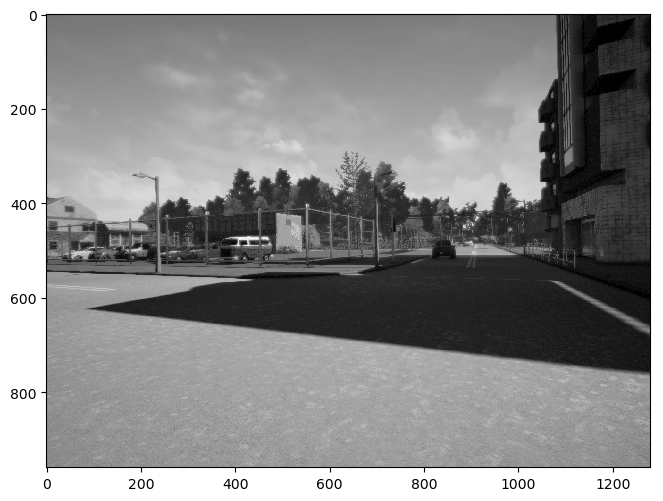

In [3]:
image = dataset_handler.images[0]

plt.figure(figsize=(8, 6), dpi=100)
plt.imshow(image, cmap='gray')

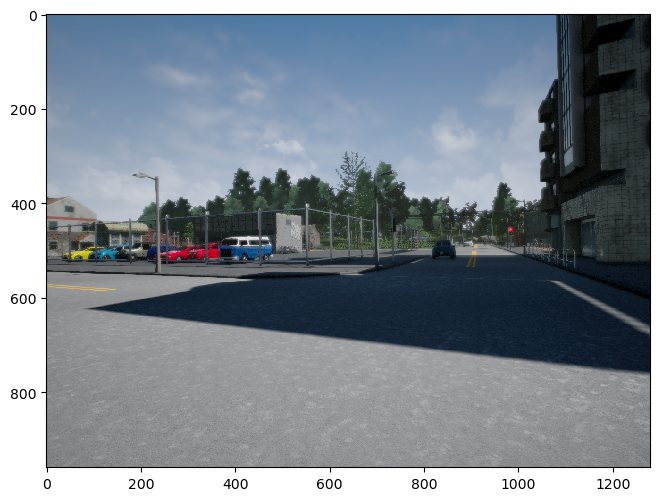

In [4]:
image_rgb = dataset_handler.images_rgb[0]

plt.figure(figsize=(8, 6), dpi=100)
plt.imshow(image_rgb)

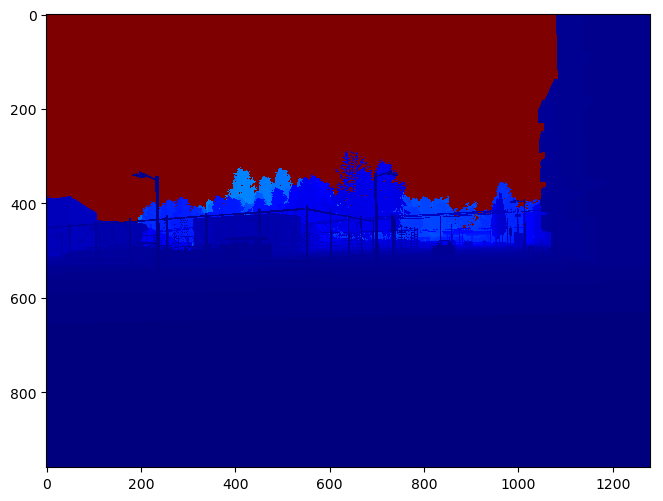

In [5]:
i = 0
depth = dataset_handler.depth_maps[i]

plt.figure(figsize=(8, 6), dpi=100)
plt.imshow(depth, cmap='jet')

In [6]:
print("Depth map shape: {0}".format(depth.shape))

v, u = depth.shape
depth_val = depth[v-1, u-1]
print("Depth value of the very bottom-right pixel of depth map {0} is {1:0.3f}".format(i, depth_val))

Depth map shape: (960, 1280)
Depth value of the very bottom-right pixel of depth map 0 is 1.862


In [7]:
dataset_handler.k

array([[640.,   0., 640.],
       [  0., 480., 480.],
       [  0.,   0.,   1.]], dtype=float32)

In order to access an arbitrary frame use image index, as shown in the examples below. Make sure the indexes are within the number of frames in the dataset. The number of frames in the dataset can be accessed with num_frames attribute.

In [8]:
# Number of frames in the dataset
print(dataset_handler.num_frames)

52


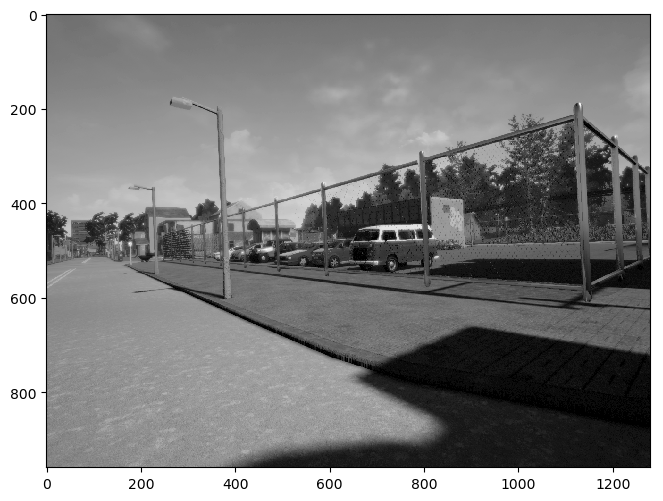

In [9]:
i = 30
image = dataset_handler.images[i]

plt.figure(figsize=(8, 6), dpi=100)
plt.imshow(image, cmap='gray')

## 1 - Feature Extraction

### 1.1 - Extracting Features from an Image

**Task**: Implement feature extraction from a single image. You can use any feature descriptor of your choice covered in the lectures, ORB for example. 


Note 1: Make sure you understand the structure of the keypoint descriptor object, this will be very useful for your further tasks. You might find [OpenCV: Keypoint Class Description](https://docs.opencv.org/3.4.3/d2/d29/classcv_1_1KeyPoint.html) handy.

Note 2: Make sure you understand the image coordinate system, namely the origin location and axis directions.

Note 3: We provide you with a function to visualise the features detected. Run the last 2 cells in section 1.1 to view.

***Optional***: Try to extract features with different descriptors such as SIFT, ORB, SURF and BRIEF. You can also try using detectors such as Harris corners or FAST and pairing them with a descriptor. Lastly, try changing parameters of the algorithms. Do you see the difference in various approaches?
You might find this link useful:  [OpenCV:Feature Detection and Description](https://docs.opencv.org/3.4.3/db/d27/tutorial_py_table_of_contents_feature2d.html). 

In [10]:
def extract_features(image):
    """
    Find keypoints and descriptors for the image

    Arguments:
    image -- a grayscale image

    Returns:
    kp -- list of the extracted keypoints (features) in an image
    des -- list of the keypoint descriptors in an image
    """
    ### START CODE HERE ###         
    
    detector = cv2.ORB_create(nfeatures=1000)
    kp, des = detector.detectAndCompute(image, None)
    
    ### END CODE HERE ###
    
    return kp, des

In [11]:
i = 0
image = dataset_handler.images[i]
kp, des = extract_features(image)
print("Number of features detected in frame {0}: {1}\n".format(i, len(kp)))

print("Coordinates of the first keypoint in frame {0}: {1}".format(i, str(kp[0].pt)))

Number of features detected in frame 0: 1000

Coordinates of the first keypoint in frame 0: (832.0, 391.0)


In [12]:
def visualize_features(image, kp):
    """
    Visualize extracted features in the image

    Arguments:
    image -- a grayscale image
    kp -- list of the extracted keypoints

    Returns:
    """
    display = cv2.drawKeypoints(image, kp, None)
    plt.imshow(display)

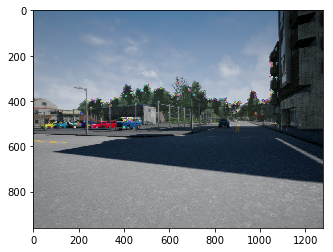

In [13]:
# Optional: visualizing and experimenting with various feature descriptors
i = 0
image = dataset_handler.images_rgb[i]

visualize_features(image, kp)

### 1.2 - Extracting Features from Each Image in the Dataset

**Task**: Implement feature extraction for each image in the dataset with the function you wrote in the above section. 

**Note**: If you do not remember how to pass functions as arguments, make sure to brush up on this topic. This [
Passing Functions as Arguments](https://www.coursera.org/lecture/program-code/passing-functions-as-arguments-hnmqD) might be helpful.

In [14]:
def extract_features_dataset(images, extract_features_function):
    """
    Find keypoints and descriptors for each image in the dataset

    Arguments:
    images -- a list of grayscale images
    extract_features_function -- a function which finds features (keypoints and descriptors) for an image

    Returns:
    kp_list -- a list of keypoints for each image in images
    des_list -- a list of descriptors for each image in images
    
    """
    kp_list = []
    des_list = []
    
    ### START CODE HERE ###
    for image in images:
        kp_current, des_current = extract_features_function(image)
        kp_list.append(kp_current)
        des_list.append(des_current)
    ### END CODE HERE ###
    
    return kp_list, des_list

In [15]:
images = dataset_handler.images
kp_list, des_list = extract_features_dataset(images, extract_features)

i = 0
print("Number of features detected in frame {0}: {1}".format(i, len(kp_list[i])))
print("Coordinates of the first keypoint in frame {0}: {1}\n".format(i, str(kp_list[i][0].pt)))

# Remember that the length of the returned by dataset_handler lists should be the same as the length of the image array
print("Length of images array: {0}".format(len(images)))

Number of features detected in frame 0: 1000
Coordinates of the first keypoint in frame 0: (832.0, 391.0)

Length of images array: 52


## 2 - Feature Matching

Next step after extracting the features in each image is matching the features from the subsequent frames. This is what is needed to be done in this section.

### 2.1 - Matching Features from a Pair of Subsequent Frames

**Task**: Implement feature matching for a pair of images. You can use any feature matching algorithm of your choice covered in the lectures, Brute Force Matching or FLANN based Matching for example.

***Optional 1***: Implement match filtering by thresholding the distance between the best matches. This might be useful for improving your overall trajectory estimation results. Recall that you have an option of specifying the number best matches to be returned by the matcher.

We have provided a visualization of the found matches. Do all the matches look legitimate to you? Do you think match filtering can improve the situation?

In [16]:
def match_features(des1, des2):
    """
    Match features from two images

    Arguments:
    des1 -- list of the keypoint descriptors in the first image
    des2 -- list of the keypoint descriptors in the second image

    Returns:
    match -- list of matched features from two images. Each match[i] is k or less matches for the same query descriptor
    """
    ### START CODE HERE ###
    matcher = cv2.BFMatcher()
    match = matcher.knnMatch(des1, des2, k=2)
    ### END CODE HERE ###

    return match

In [17]:
i = 0 
des1 = des_list[i]
des2 = des_list[i+1]

match = match_features(des1, des2)
print("Number of features matched in frames {0} and {1}: {2}".format(i, i+1, len(match)))

# Remember that a matcher finds the best matches for EACH descriptor from a query set

Number of features matched in frames 0 and 1: 1000


In [18]:
# Optional
def filter_matches_distance(match, dist_threshold):
    """
    Filter matched features from two images by distance between the best matches

    Arguments:
    match -- list of matched features from two images
    dist_threshold -- maximum allowed relative distance between the best matches, (0.0, 1.0) 

    Returns:
    filtered_match -- list of good matches, satisfying the distance threshold
    """
    filtered_match = []
    
    ### START CODE HERE ###
    for m, n in match:
        if m.distance < n.distance * dist_threshold:
            filtered_match.append([m])
    ### END CODE HERE ###

    return filtered_match

In [19]:
# Optional
i = 0 
des1 = des_list[i]
des2 = des_list[i+1]
match = match_features(des1, des2)

dist_threshold = 0.6
filtered_match = filter_matches_distance(match, dist_threshold)

print("Number of features matched in frames {0} and {1} after filtering by distance: {2}".format(i, i+1, len(filtered_match)))

Number of features matched in frames 0 and 1 after filtering by distance: 123


In [20]:
def visualize_matches(image1, kp1, image2, kp2, match):
    """
    Visualize corresponding matches in two images

    Arguments:
    image1 -- the first image in a matched image pair
    kp1 -- list of the keypoints in the first image
    image2 -- the second image in a matched image pair
    kp2 -- list of the keypoints in the second image
    match -- list of matched features from the pair of images

    Returns:
    image_matches -- an image showing the corresponding matches on both image1 and image2 or None if you don't use this function
    """
    image_matches = cv2.drawMatchesKnn(image1, kp1, image2, kp2, match, None, flags=2)
    plt.figure(figsize=(16, 6), dpi=100)
    plt.imshow(image_matches)

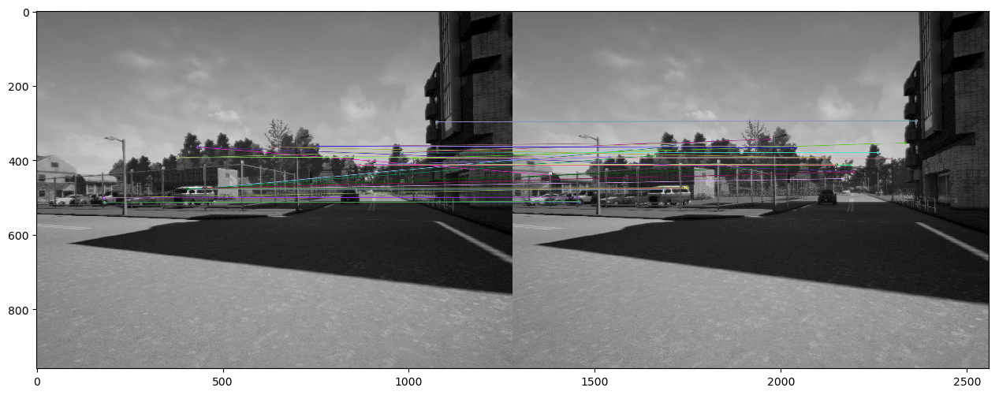

In [21]:
# Visualize n first matches, set n to None to view all matches
# set filtering to True if using match filtering, otherwise set to False
n = 20
filtering = False

i = 0 
image1 = dataset_handler.images[i]
image2 = dataset_handler.images[i+1]

kp1 = kp_list[i]
kp2 = kp_list[i+1]

des1 = des_list[i]
des2 = des_list[i+1]

match = match_features(des1, des2)
if filtering:
    dist_threshold = 0.6
    match = filter_matches_distance(match, dist_threshold)

image_matches = visualize_matches(image1, kp1, image2, kp2, match[:n])

### 2.2 - Matching Features in Each Subsequent Image Pair in the Dataset

**Task**: Implement feature matching for each subsequent image pair in the dataset with the function you wrote in the above section.

***Optional***: Implement match filtering by thresholding the distance for each subsequent image pair in the dataset with the function you wrote in the above section.

In [22]:
def match_features_dataset(des_list, match_features):
    """
    Match features for each subsequent image pair in the dataset

    Arguments:
    des_list -- a list of descriptors for each image in the dataset
    match_features -- a function which maches features between a pair of images

    Returns:
    matches -- list of matches for each subsequent image pair in the dataset. 
               Each matches[i] is a list of matched features from images i and i + 1
               
    """
    matches = []
    
    ### START CODE HERE ###
    for i in range(0, len(des_list) - 1):
        match = match_features(des_list[i], des_list[i+1])
        matches.append(match)
    ### END CODE HERE ###
    
    return matches

In [23]:
matches = match_features_dataset(des_list, match_features)

i = 0
print("Number of features matched in frames {0} and {1}: {2}".format(i, i+1, len(matches[i])))

Number of features matched in frames 0 and 1: 1000


In [24]:
# Optional
def filter_matches_dataset(filter_matches_distance, matches, dist_threshold):
    """
    Filter matched features by distance for each subsequent image pair in the dataset

    Arguments:
    filter_matches_distance -- a function which filters matched features from two images by distance between the best matches
    matches -- list of matches for each subsequent image pair in the dataset. 
               Each matches[i] is a list of matched features from images i and i + 1
    dist_threshold -- maximum allowed relative distance between the best matches, (0.0, 1.0) 

    Returns:
    filtered_matches -- list of good matches for each subsequent image pair in the dataset. 
                        Each matches[i] is a list of good matches, satisfying the distance threshold
               
    """
    filtered_matches = []
    
    ### START CODE HERE ###
    for match in matches:
        filtered_match = filter_matches_distance(match, dist_threshold)
        filtered_matches.append(filtered_match)
    
    ### END CODE HERE ###
    
    return filtered_matches

In [25]:
# Optional
dist_threshold = 0.6

filtered_matches = filter_matches_dataset(filter_matches_distance, matches, dist_threshold)

if len(filtered_matches) > 0:
    
    # Make sure that this variable is set to True if you want to use filtered matches further in your assignment
    is_main_filtered_m = False
    if is_main_filtered_m: 
        matches = filtered_matches

    i = 0
    print("Number of filtered matches in frames {0} and {1}: {2}".format(i, i+1, len(filtered_matches[i])))

Number of filtered matches in frames 0 and 1: 123


## 3 - Trajectory Estimation

At this point you have everything to perform visual odometry for the autonomous vehicle. In this section you will incrementally estimate the pose of the vehicle by examining the changes that motion induces on the images of its onboard camera.

### 3.1 - Estimating Camera Motion between a Pair of Images

**Task**: Implement camera motion estimation from a pair of images. You can use the motion estimation algorithm covered in the lecture materials, namely Perspective-n-Point (PnP), as well as Essential Matrix Decomposition.

- If you decide to use PnP, you will need depth maps of frame and they are provided with the dataset handler. Check out Section 0 of this assignment to recall how to access them if you need. As this method has been covered in the course, review the lecture materials if need be.
- If you decide to use Essential Matrix Decomposition, more information about this method can be found in [Wikipedia: Determining R and t from E](https://en.wikipedia.org/wiki/Essential_matrix).

More information on both approaches implementation can be found in [OpenCV: Camera Calibration and 3D Reconstruction](https://docs.opencv.org/3.4.3/d9/d0c/group__calib3d.html). Specifically, you might be interested in _Detailed Description_ section of [OpenCV: Camera Calibration and 3D Reconstruction](https://docs.opencv.org/3.4.3/d9/d0c/group__calib3d.html) as it explains the connection between the 3D world coordinate system and the 2D image coordinate system.


***Optional***: Implement camera motion estimation with PnP, PnP with RANSAC and Essential Matrix Decomposition. Check out how filtering matches by distance changes estimated camera movement. Do you see the difference in various approaches?

In [26]:
def estimate_motion(match, kp1, kp2, k, depth1=None):
    """
    Estimate camera motion from a pair of subsequent image frames

    Arguments:
    match -- list of matched features from the pair of images
    kp1 -- list of the keypoints in the first image
    kp2 -- list of the keypoints in the second image
    k -- camera calibration matrix 
    
    Optional arguments:
    depth1 -- a depth map of the first frame. This argument is not needed if you use Essential Matrix Decomposition

    Returns:
    rmat -- recovered 3x3 rotation numpy matrix
    tvec -- recovered 3x1 translation numpy vector
    image1_points -- a list of selected match coordinates in the first image. image1_points[i] = [u, v], where u and v are 
                     coordinates of the i-th match in the image coordinate system
    image2_points -- a list of selected match coordinates in the second image. image1_points[i] = [u, v], where u and v are 
                     coordinates of the i-th match in the image coordinate system
    """
    rmat = np.eye(3)
    tvec = np.zeros((3, 1))
    image1_points = []
    image2_points = []

    ### START CODE HERE ###
    # Estimate motion with SolvePnPRansac
    fx = k.item(0)
    fy = k.item(4)
    cx = k.item(2)
    cy = k.item(5)
    
    # 3D object points
    image1_3D = []
    # Visualization points
    image1_points = []
    
    for m in match:
   
        pt1_coordinates = kp1[m[0].queryIdx].pt
        u1, v1 = pt1_coordinates
        z1 = depth1[int(np.round(v1, 0)), int(np.round(u1, 0))]
        x3d = (u1 - cx) / fx * z1
        y3d = (v1 - cy) / fy * z1
        
        pt2_coordinates = kp2[m[0].trainIdx].pt
        u2, v2 = pt2_coordinates
        
        # Filter points that are too far from the camera (> 1000m)
        if z1 < 999:
            image1_3D.append([x3d, y3d, z1])
            image2_points.append([u2, v2])
            # Visualization points
            image1_points.append([u2, v2])
            
            print("u1 = {0}, v1 = {1}".format(u1, v1))
            print("x3d = {0}, y3d = {1}, z3d = {2}".format(x3d, y3d, z1))

    image1_3D = np.array(image1_3D, dtype=np.float32)
    image2_points = np.array(image2_points, dtype=np.float32)
    # Visualization points
    image1_points = np.array(image1_points, dtype=np.float32)
    
    _, rvec, tvec, inliers = cv2.solvePnPRansac(image1_3D, image2_points, k, None,
                                               reprojectionError=1,
                                               iterationsCount=300,
                                               confidence=0.99,
                                               flags=cv2.SOLVEPNP_EPNP)
    rmat, _ = cv2.Rodrigues(rvec)
    # Filter outliers
    inlier_indecis = list(inliers.reshape(-1, ))
    image1_3D = image1_3D[inlier_indecis]
    image2_points = image2_points[inlier_indecis]
    # Visualization points
    image1_points = image1_points[inlier_indecis]
    ### END CODE HERE ###
    
    return rmat, tvec, image1_points, image2_points

In [27]:
i = 30
match = matches[i]
kp1 = kp_list[i]
kp2 = kp_list[i+1]
k = dataset_handler.k
depth = dataset_handler.depth_maps[i]

rmat, tvec, image1_points, image2_points = estimate_motion(match, kp1, kp2, k, depth1=depth)

print("Estimated rotation:\n {0}".format(rmat))
print("Estimated translation:\n {0}".format(tvec))

u1 = 832.0, v1 = 335.0
x3d = 67.5804, y3d = -68.04970833333333, z3d = 225.268
u1 = 816.0, v1 = 471.0
x3d = 9.078850000000001, y3d = -0.6190125000000001, z3d = 33.014
u1 = 541.0, v1 = 520.0
x3d = -2.6207156250000003, y3d = 1.4118333333333333, z3d = 16.942
u1 = 1125.0, v1 = 189.0
x3d = 3.7981562499999995, y3d = -3.0385249999999995, z3d = 5.012
u1 = 1130.0, v1 = 189.0
x3d = 3.8304218749999994, y3d = -3.033068749999999, z3d = 5.002999999999999
u1 = 312.0, v1 = 191.0
x3d = -3.8012124999999997, y3d = -4.465652083333333, z3d = 7.417
u1 = 816.0, v1 = 473.0
x3d = 3.893725, y3d = -0.20648541666666664, z3d = 14.158999999999999
u1 = 700.0, v1 = 530.0
x3d = 1.1023125, y3d = 1.2247916666666667, z3d = 11.758
u1 = 449.0, v1 = 501.0
x3d = -6.948221875000001, y3d = 1.0185875, z3d = 23.282
u1 = 787.0, v1 = 474.0
x3d = 3.3157687499999997, y3d = -0.18045, z3d = 14.436
u1 = 177.0, v1 = 468.0
x3d = -22.245703125, y3d = -0.76875, z3d = 30.75
u1 = 817.0, v1 = 466.0
x3d = 3.9329953124999997, y3d = -0.4147791666

x3d = 4.4188519306182865, y3d = -0.5970083945592245, z3d = 39.695
u1 = 1140.4801025390625, v1 = 228.09603881835938
x3d = 4.0398128276824945, y3d = -2.7111163822174067, z3d = 5.1659999999999995
u1 = 729.9072875976562, v1 = 526.6944580078125
x3d = 1.7263604020118715, y3d = 1.1954754051208496, z3d = 12.289
u1 = 702.9505004882812, v1 = 470.707275390625
x3d = 1.3236326329231263, y3d = -0.2605254063924154, z3d = 13.457
u1 = 812.851318359375, v1 = 474.8544616699219
x3d = 3.786794272994995, y3d = -0.15030331859588625, z3d = 14.021
u1 = 700.8768920898438, v1 = 524.620849609375
x3d = 1.1167104892730713, y3d = 1.0913516133626302, z3d = 11.74
u1 = 543.2832641601562, v1 = 520.4736938476562
x3d = -2.565260298252106, y3d = 1.4313353188832603, z3d = 16.975
u1 = 673.9201049804688, v1 = 379.4688415527344
x3d = 8.015320806884764, y3d = -31.67401698811849, z3d = 151.232
u1 = 155.52001953125, v1 = 476.9280700683594
x3d = -93.37367523574828, y3d = -0.7894027943293254, z3d = 123.347
u1 = 825.2929077148438, v

x3d = 3.0189650011062623, y3d = -1.785266865412394, z3d = 6.01
u1 = 752.4681396484375, v1 = 462.82763671875
x3d = 6.375361934852599, y3d = -1.2979086822509764, z3d = 36.278999999999996
u1 = 791.2859497070312, v1 = 462.82763671875
x3d = 8.167786594104767, y3d = -1.2361597259521484, z3d = 34.553
u1 = 143.3272705078125, v1 = 424.00982666015625
x3d = -94.31582317714691, y3d = -14.176361951065063, z3d = 121.533
u1 = 698.720458984375, v1 = 525.5333251953125
x3d = 1.0767864166259766, y3d = 1.1132898010253907, z3d = 11.736
u1 = 812.1878662109375, v1 = 465.8136291503906
x3d = 8.930093211364746, y3d = -0.9809875442504883, z3d = 33.192
u1 = 179.15908813476562, v1 = 424.00982666015625
x3d = -90.48755317258835, y3d = -14.65846067276001, z3d = 125.666
u1 = 740.5242309570312, v1 = 343.38824462890625
x3d = 40.400374283409114, y3d = -73.20511676254273, z3d = 257.214
u1 = 734.55224609375, v1 = 462.82763671875
x3d = 5.5051567909240715, y3d = -1.333112026977539, z3d = 37.263
u1 = 701.7064208984375, v1 = 4

**Expected Output Format**:

Make sure that your estimated rotation matrix and translation vector are in the same format as the given initial values

```
rmat = np.eye(3)
tvec = np.zeros((3, 1))

print("Initial rotation:\n {0}".format(rmat))
print("Initial translation:\n {0}".format(tvec))
```


```
Initial rotation:
 [[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
Initial translation:
 [[0.]
 [0.]
 [0.]]
```

**Camera Movement Visualization**:
You can use `visualize_camera_movement` that is provided to you. This function visualizes final image matches from an image pair connected with an arrow corresponding to direction of camera movement (when `is_show_img_after_mov = False`). The function description:
```
Arguments:
image1 -- the first image in a matched image pair (RGB or grayscale)
image1_points -- a list of selected match coordinates in the first image. image1_points[i] = [x, y], where x and y are 
                 coordinates of the i-th match in the image coordinate system
image2 -- the second image in a matched image pair (RGB or grayscale)
image2_points -- a list of selected match coordinates in the second image. image1_points[i] = [x, y], where x and y are 
                 coordinates of the i-th match in the image coordinate system
is_show_img_after_mov -- a boolean variable, controling the output (read image_move description for more info) 

Returns:
image_move -- an image with the visualization. When is_show_img_after_mov=False then the image points from both images are visualized on the first image. Otherwise, the image points from the second image only are visualized on the second image
```

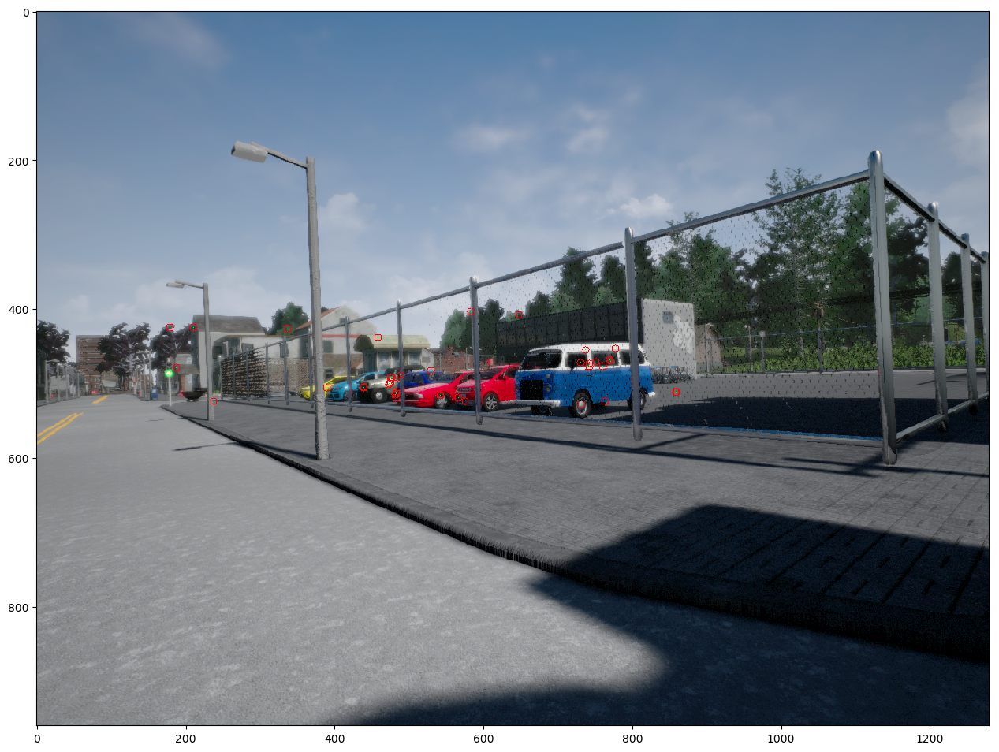

In [28]:
i=30
image1  = dataset_handler.images_rgb[i]
image2 = dataset_handler.images_rgb[i + 1]

image_move = visualize_camera_movement(image1, image1_points, image2, image2_points)
plt.figure(figsize=(16, 12), dpi=100)
plt.imshow(image_move)

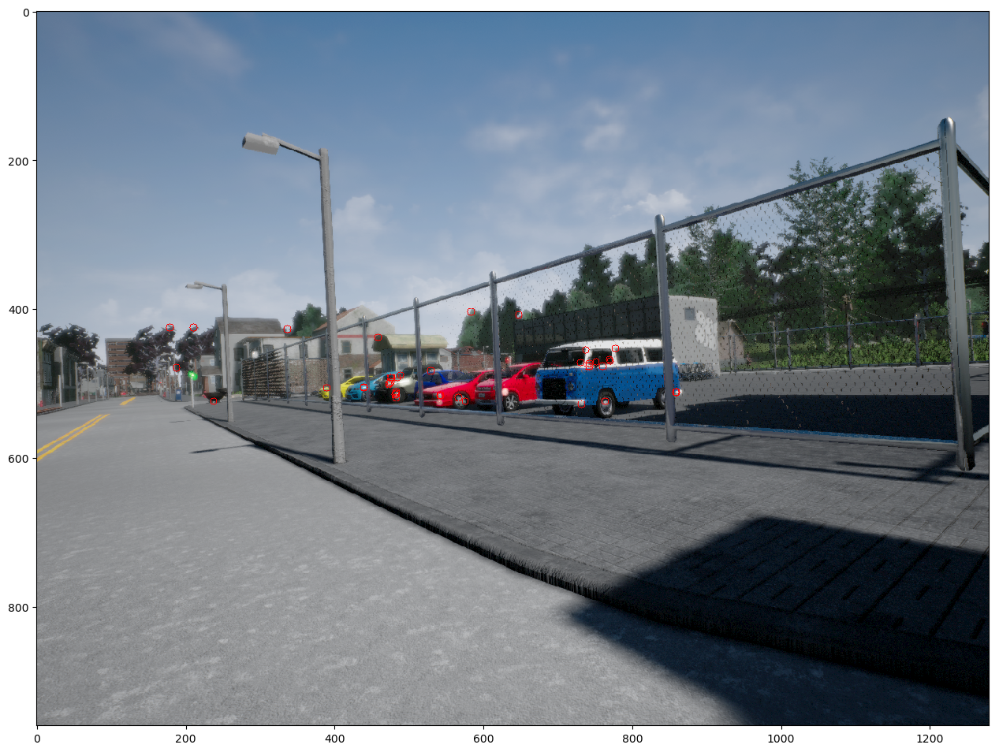

In [29]:
image_move = visualize_camera_movement(image1, image1_points, image2, image2_points, is_show_img_after_move=True)
plt.figure(figsize=(16, 12), dpi=100)
plt.imshow(image_move)
# These visualizations might be helpful for understanding the quality of image points selected for the camera motion estimation

### 3.2 - Camera Trajectory Estimation

**Task**: Implement camera trajectory estimation with visual odometry. More specifically, implement camera motion estimation for each subsequent image pair in the dataset with the function you wrote in the above section.

***Note***: Do not forget that the image pairs are not independent one to each other. i-th and (i + 1)-th image pairs have an image in common

In [30]:
def estimate_trajectory(estimate_motion, matches, kp_list, k, depth_maps=[]):
    """
    Estimate complete camera trajectory from subsequent image pairs

    Arguments:
    estimate_motion -- a function which estimates camera motion from a pair of subsequent image frames
    matches -- list of matches for each subsequent image pair in the dataset. 
               Each matches[i] is a list of matched features from images i and i + 1
    des_list -- a list of keypoints for each image in the dataset
    k -- camera calibration matrix 
    
    Optional arguments:
    depth_maps -- a list of depth maps for each frame. This argument is not needed if you use Essential Matrix Decomposition

    Returns:
    trajectory -- a 3xlen numpy array of the camera locations, where len is the lenght of the list of images and   
                  trajectory[:, i] is a 3x1 numpy vector, such as:
                  
                  trajectory[:, i][0] - is X coordinate of the i-th location
                  trajectory[:, i][1] - is Y coordinate of the i-th location
                  trajectory[:, i][2] - is Z coordinate of the i-th location
                  
                  * Consider that the origin of your trajectory cordinate system is located at the camera position 
                  when the first image (the one with index 0) was taken. The first camera location (index = 0) is geven 
                  at the initialization of this function

    """
    trajectory = np.zeros((3, 1))
    
    
    ### START CODE HERE ###
    
    current_rot = np.eye(3)
    
    for i in range(0, len(matches)):
        
        rmat, tvec, image1_points, image2_points = estimate_motion(matches[i], kp_list[i], kp_list[i+1], k, depth_maps[i])
        current_pos = trajectory[:, [-1]] - np.matrix(current_rot).T * np.matrix(tvec)

        trajectory = np.hstack((trajectory, current_pos))
        current_rot = rmat.dot(current_rot)
        
    ### END CODE HERE ###
    
    return trajectory

In [31]:
depth_maps = dataset_handler.depth_maps
trajectory = estimate_trajectory(estimate_motion, matches, kp_list, k, depth_maps=depth_maps)

i = 1
print("Camera location in point {0} is: \n {1}\n".format(i, trajectory[:, [i]]))

# Remember that the length of the returned by trajectory should be the same as the length of the image array
print("Length of trajectory: {0}".format(trajectory.shape[1]))

u1 = 183.0, v1 = 514.0
x3d = -19.8016671875, y3d = 1.9642791666666666, z3d = 27.730999999999998
u1 = 430.0, v1 = 479.0
x3d = -14.952984375, y3d = -0.09493958333333333, z3d = 45.571
u1 = 425.0, v1 = 479.0
x3d = -7.4521015625, y3d = -0.04621458333333333, z3d = 22.183
u1 = 410.0, v1 = 479.0
x3d = -16.636546875, y3d = -0.09644375, z3d = 46.293
u1 = 182.0, v1 = 502.0
x3d = -20.0231875, y3d = 1.2824166666666665, z3d = 27.98
u1 = 405.0, v1 = 477.0
x3d = -8.5705234375, y3d = -0.14588125000000002, z3d = 23.341
u1 = 1013.0, v1 = 395.0
x3d = 15.955074999999999, y3d = -4.847833333333334, z3d = 27.376
u1 = 185.0, v1 = 515.0
x3d = -19.7718828125, y3d = 2.027885416666667, z3d = 27.811
u1 = 471.0, v1 = 476.0
x3d = -6.488807812499999, y3d = -0.204775, z3d = 24.573
u1 = 457.0, v1 = 476.0
x3d = -6.795590625, y3d = -0.19804999999999998, z3d = 23.766
u1 = 449.0, v1 = 476.0
x3d = -6.969709375, y3d = -0.19461666666666666, z3d = 23.354
u1 = 1076.0, v1 = 297.0
x3d = 16.6238625, y3d = -9.3032625, z3d = 24.402
u

u1 = 53.0, v1 = 515.0
x3d = -27.0707890625, y3d = 2.152135416666667, z3d = 29.515
u1 = 904.0, v1 = 484.0
x3d = 29.5024125, y3d = 0.5960083333333334, z3d = 71.521
u1 = 164.0, v1 = 494.0
x3d = -32.3635375, y3d = 1.2691583333333332, z3d = 43.513999999999996
u1 = 990.0, v1 = 455.0
x3d = 20.671875, y3d = -1.96875, z3d = 37.8
u1 = 451.0, v1 = 410.0
x3d = -5.0773078125, y3d = -2.5073125000000003, z3d = 17.193
u1 = 430.0, v1 = 487.0
x3d = -5.747109375, y3d = 0.25542708333333336, z3d = 17.515
u1 = 429.0, v1 = 477.0
x3d = -7.995910937500001, y3d = -0.15158125, z3d = 24.253
u1 = 336.0, v1 = 407.0
x3d = -105.34740000000001, y3d = -33.72965, z3d = 221.78400000000002
u1 = 470.0, v1 = 484.0
x3d = -4.512171875, y3d = 0.1415583333333333, z3d = 16.987
u1 = 401.0, v1 = 514.0
x3d = -7.745840625, y3d = 1.469225, z3d = 20.742
u1 = 912.0, v1 = 434.0
x3d = 76.352525, y3d = -17.216745833333338, z3d = 179.65300000000002
u1 = 988.0, v1 = 457.0
x3d = 20.570062500000002, y3d = -1.8126875000000005, z3d = 37.8300000

u1 = 276.0, v1 = 464.0
x3d = -30.85184375, y3d = -1.8081666666666667, z3d = 54.245000000000005
u1 = 761.0, v1 = 359.0
x3d = 17.100703125, y3d = -22.8009375, z3d = 90.45
u1 = 539.0, v1 = 427.0
x3d = -7.740229687499999, y3d = -5.41560625, z3d = 49.047
u1 = 772.0, v1 = 389.0
x3d = 38.96866875, y3d = -35.819685416666665, z3d = 188.939
u1 = 246.0, v1 = 421.0
x3d = -12.314346875, y3d = -2.4587020833333333, z3d = 20.003
u1 = 488.0, v1 = 420.0
x3d = -10.258575, y3d = -5.39925, z3d = 43.194
u1 = 990.0, v1 = 385.0
x3d = 94.00015625000002, y3d = -34.01910416666667, z3d = 171.88600000000002
u1 = 790.0, v1 = 392.0
x3d = 47.0540625, y3d = -36.806733333333334, z3d = 200.764
u1 = 444.0, v1 = 470.0
x3d = -6.976987500000001, y3d = -0.47462499999999996, z3d = 22.782
u1 = 172.0, v1 = 511.0
x3d = -19.77519375, y3d = 1.7465270833333337, z3d = 27.043000000000003
u1 = 419.0, v1 = 486.0
x3d = -7.452534375000001, y3d = 0.26977500000000004, z3d = 21.582
u1 = 452.0, v1 = 470.0
x3d = -6.811768750000001, y3d = -0.4

u1 = 189.11236572265625, v1 = 492.6874694824219
x3d = -19.689699379348756, y3d = 0.7387279106140137, z3d = 27.948
u1 = 345.8765563964844, v1 = 393.1546630859375
x3d = -117.66592188510894, y3d = -46.324026421101884, z3d = 256.036
u1 = 806.2158813476562, v1 = 390.66632080078125
x3d = 50.80933809251785, y3d = -36.41036041145325, z3d = 195.637
u1 = 1060.0245361328125, v1 = 221.4605255126953
x3d = 15.966182679748533, y3d = -13.103642365264891, z3d = 24.328
u1 = 490.19915771484375, v1 = 420.52618408203125
x3d = -10.157199298381807, y3d = -5.376804670333863, z3d = 43.395
u1 = 296.1101379394531, v1 = 390.66632080078125
x3d = -82.85972493557931, y3d = -28.699747225570682, z3d = 154.20700000000002
u1 = 537.4772338867188, v1 = 427.99114990234375
x3d = -7.815118230628967, y3d = -5.286049501800537, z3d = 48.786
u1 = 875.8888549804688, v1 = 510.105712890625
x3d = 11.904647073459625, y3d = 2.0258008763631183, z3d = 32.299
u1 = 1060.0245361328125, v1 = 286.1568603515625
x3d = 16.0331240901947, y3d = -

u1 = 404.6400146484375, v1 = 480.96002197265625
x3d = -7.527842031478881, y3d = 0.04094093704223632, z3d = 20.47
u1 = 872.6400146484375, v1 = 413.280029296875
x3d = 66.85746870975495, y3d = -25.56584177398682, z3d = 183.92700000000002
u1 = 126.72000122070312, v1 = 482.4000244140625
x3d = -32.9269119216919, y3d = 0.20528208821614585, z3d = 41.056000000000004
u1 = 167.04000854492188, v1 = 508.32000732421875
x3d = -19.76751064286232, y3d = 1.5781914081573485, z3d = 26.749
u1 = 987.8400268554688, v1 = 371.52001953125
x3d = 93.41026521186828, y3d = -38.84216100667317, z3d = 171.868
u1 = 416.1600036621094, v1 = 480.96002197265625
x3d = -7.47730512766838, y3d = 0.0427589786529541, z3d = 21.378999999999998
u1 = 1097.280029296875, v1 = 361.44000244140625
x3d = 16.974377587509156, y3d = -5.8679788791656495, z3d = 23.757
u1 = 874.0800170898438, v1 = 492.4800109863281
x3d = 8.442607866382598, y3d = 0.6001585283279418, z3d = 23.083
u1 = 840.9600219726562, v1 = 388.8000183105469
x3d = 64.62528906602

u1 = 352.0, v1 = 486.0
x3d = -9.173250000000001, y3d = 0.25481250000000005, z3d = 20.385
u1 = 130.0, v1 = 494.0
x3d = -23.264765625, y3d = 0.8515208333333334, z3d = 29.195
u1 = 546.0, v1 = 392.0
x3d = -14.878584375, y3d = -18.571849999999998, z3d = 101.301
u1 = 437.0, v1 = 469.0
x3d = -6.9663890625, y3d = -0.50331875, z3d = 21.963
u1 = 127.0, v1 = 493.0
x3d = -23.170767187499997, y3d = 0.7828979166666667, z3d = 28.907
u1 = 603.0, v1 = 406.0
x3d = -5.367139062500001, y3d = -14.312370833333334, z3d = 92.837
u1 = 998.0, v1 = 458.0
x3d = 20.611849999999997, y3d = -1.6888666666666665, z3d = 36.848
u1 = 389.0, v1 = 512.0
x3d = -7.74335, y3d = 1.3162666666666667, z3d = 19.744
u1 = 388.0, v1 = 483.0
x3d = -6.6677625, y3d = 0.10583750000000001, z3d = 16.934
u1 = 412.0, v1 = 480.0
x3d = -7.48303125, y3d = 0.0, z3d = 21.005
u1 = 127.0, v1 = 490.0
x3d = -23.381578125, y3d = 0.6077083333333333, z3d = 29.17
u1 = 444.0, v1 = 471.0
x3d = -6.808243750000001, y3d = -0.41683125000000004, z3d = 22.231
u1 

x3d = 0.6510129446983336, y3d = -21.6718464345932, z3d = 93.10499999999999
u1 = 783.8209838867188, v1 = 390.66632080078125
x3d = 45.06181089515686, y3d = -37.31988893280029, z3d = 200.524
u1 = 457.8509826660156, v1 = 480.2458801269531
x3d = -12.854882290506364, y3d = 0.023136807696024577, z3d = 45.167
u1 = 970.4450073242188, v1 = 360.8064880371094
x3d = 89.62959399442671, y3d = -43.10658192119598, z3d = 173.593
u1 = 801.2392578125, v1 = 388.1780090332031
x3d = 49.225085728454594, y3d = -37.37671531047821, z3d = 195.387
u1 = 1074.9544677734375, v1 = 348.3648681640625
x3d = 16.022635206604004, y3d = -6.465478892008464, z3d = 23.576
u1 = 427.99114990234375, v1 = 330.9466247558594
x3d = -85.03608724651336, y3d = -79.71312402483622, z3d = 256.702
u1 = 437.9444274902344, v1 = 348.3648681640625
x3d = -81.41766151914597, y3d = -70.72262001800537, z3d = 257.886
u1 = 564.8487548828125, v1 = 338.4115905761719
x3d = -14.470019975852967, y3d = -36.34957938518524, z3d = 123.229
u1 = 393.154663085937

x3d = -84.13238884906768, y3d = -31.164653751182556, z3d = 152.469
u1 = 993.60009765625, v1 = 381.8880310058594
x3d = 94.27144353561403, y3d = -34.87614777825674, z3d = 170.627
u1 = 473.4720458984375, v1 = 508.03204345703125
x3d = -6.009317343711854, y3d = 1.3487500909169516, z3d = 23.095000000000002
u1 = 991.8720703125, v1 = 369.7920227050781
x3d = 93.93499817047119, y3d = -39.22784071826935, z3d = 170.853
u1 = 378.4320373535156, v1 = 383.61602783203125
x3d = -60.778585720443736, y3d = -29.861360977172854, z3d = 148.71200000000002
u1 = 383.61602783203125, v1 = 385.3440246582031
x3d = -59.759498512744905, y3d = -29.417302336692813, z3d = 149.175
u1 = 160.70401000976562, v1 = 508.03204345703125
x3d = -19.612941690397264, y3d = 1.529439971033732, z3d = 26.189
u1 = 997.0560913085938, v1 = 385.3440246582031
x3d = 95.00927849636078, y3d = -33.582756851577756, z3d = 170.298
u1 = 435.4560546875, v1 = 468.2880554199219
x3d = -6.885780158996583, y3d = -0.525695512453715, z3d = 21.545
u1 = 445.8

x3d = -74.8972365398407, y3d = -61.68007472737631, z3d = 259.16
u1 = 273.6000061035156, v1 = 388.8000183105469
x3d = -92.89384845256805, y3d = -30.829393810272215, z3d = 162.26
u1 = 924.4800415039062, v1 = 479.52001953125
x3d = 30.359798929309843, y3d = -0.06829822082519531, z3d = 68.301
u1 = 430.5600280761719, v1 = 482.4000244140625
x3d = -5.203928802394866, y3d = 0.07951080881754558, z3d = 15.902
u1 = 398.8800048828125, v1 = 473.760009765625
x3d = -17.077323654174805, y3d = -0.5892630777994792, z3d = 45.328
u1 = 420.4800109863281, v1 = 476.6400146484375
x3d = -7.056538646841049, y3d = -0.14401037216186524, z3d = 20.573
u1 = 168.48001098632812, v1 = 509.760009765625
x3d = -19.207808802461624, y3d = 1.616402530415853, z3d = 26.071
u1 = 236.16000366210938, v1 = 420.4800109863281
x3d = -11.908862892007827, y3d = -2.340251568031311, z3d = 18.873
u1 = 482.4000244140625, v1 = 508.32000732421875
x3d = -5.637400376701355, y3d = 1.350687349319458, z3d = 22.893
u1 = 455.0400085449219, v1 = 476.

u1 = 481.0, v1 = 467.0
x3d = -5.599035937500001, y3d = -0.6103770833333334, z3d = 22.537000000000003
u1 = 482.0, v1 = 474.0
x3d = -5.527284375, y3d = -0.2798625, z3d = 22.389
u1 = 452.0, v1 = 467.0
x3d = -6.20899375, y3d = -0.5724604166666667, z3d = 21.137
u1 = 181.0, v1 = 510.0
x3d = -18.741543749999998, y3d = 1.6332499999999999, z3d = 26.131999999999998
u1 = 481.0, v1 = 469.0
x3d = -5.5729500000000005, y3d = -0.5140666666666667, z3d = 22.432000000000002
u1 = 460.0, v1 = 466.0
x3d = -6.0615000000000006, y3d = -0.6286, z3d = 21.552000000000003
u1 = 1039.0, v1 = 449.0
x3d = 21.896995312500003, y3d = -2.2683604166666673, z3d = 35.123000000000005
u1 = 425.0, v1 = 514.0
x3d = -6.6559296875000005, y3d = 1.4034208333333336, z3d = 19.813000000000002
u1 = 412.0, v1 = 482.0
x3d = -7.375800000000001, y3d = 0.08626666666666667, z3d = 20.704
u1 = 414.0, v1 = 486.0
x3d = -6.840031249999999, y3d = 0.24212499999999998, z3d = 19.369999999999997
u1 = 421.0, v1 = 486.0
x3d = -6.712692187499998, y3d = 0.

u1 = 791.0, v1 = 367.0
x3d = 20.6707203125, y3d = -20.62508958333333, z3d = 87.61099999999999
u1 = 487.0, v1 = 479.0
x3d = -5.3036015625, y3d = -0.046218749999999996, z3d = 22.185
u1 = 1050.0, v1 = 450.0
x3d = 22.181640625, y3d = -2.1640625, z3d = 34.625
u1 = 461.0, v1 = 484.0
x3d = -5.8418328125, y3d = 0.17405833333333334, z3d = 20.887
u1 = 1144.0, v1 = 333.0
x3d = 17.25885, y3d = -6.711775, z3d = 21.916
u1 = 426.0, v1 = 514.0
x3d = -6.523656249999999, y3d = 1.3819583333333332, z3d = 19.509999999999998
u1 = 788.0, v1 = 296.0
x3d = 2.94080625, y3d = -4.8748499999999995, z3d = 12.716999999999999
u1 = 1097.0, v1 = 380.0
x3d = 17.1596359375, y3d = -5.006458333333334, z3d = 24.031
u1 = 570.0, v1 = 381.0
x3d = -10.985624999999999, y3d = -20.71575, z3d = 100.44
u1 = 415.0, v1 = 484.0
x3d = -6.715546875, y3d = 0.15918333333333334, z3d = 19.102
u1 = 575.0, v1 = 382.0
x3d = -10.207640625, y3d = -20.519975, z3d = 100.506
u1 = 147.0, v1 = 491.0
x3d = -22.12645625, y3d = 0.6582583333333333, z3d = 

u1 = 463.0, v1 = 465.0
x3d = -5.7776671875, y3d = -0.65284375, z3d = 20.891
u1 = 178.0, v1 = 510.0
x3d = -18.45834375, y3d = 1.598125, z3d = 25.57
u1 = 454.0, v1 = 465.0
x3d = -5.9592656250000005, y3d = -0.64078125, z3d = 20.505
u1 = 463.0, v1 = 468.0
x3d = -5.743649999999999, y3d = -0.5192, z3d = 20.767999999999997
u1 = 1063.0, v1 = 448.0
x3d = 22.551848437499995, y3d = -2.274733333333333, z3d = 34.120999999999995
u1 = 407.0, v1 = 484.0
x3d = -6.754815625000001, y3d = 0.15461666666666668, z3d = 18.554000000000002
u1 = 411.0, v1 = 470.0
x3d = -7.404214062499999, y3d = -0.4311041666666666, z3d = 20.692999999999998
u1 = 475.0, v1 = 365.0
x3d = -67.09467187499999, y3d = -62.35060416666666, z3d = 260.246
u1 = 415.0, v1 = 483.0
x3d = -6.7081640625, y3d = 0.11925625000000001, z3d = 19.081
u1 = 425.0, v1 = 484.0
x3d = -6.4180859375, y3d = 0.15920833333333334, z3d = 19.105
u1 = 489.0, v1 = 477.0
x3d = -5.15570625, y3d = -0.136575, z3d = 21.852
u1 = 463.0, v1 = 484.0
x3d = -5.6897203124999995, 

u1 = 340.0, v1 = 516.0
x3d = -9.881250000000001, y3d = 1.5810000000000002, z3d = 21.080000000000002
u1 = 550.0, v1 = 349.0
x3d = -33.86053125, y3d = -65.7145125, z3d = 240.786
u1 = 252.0, v1 = 507.0
x3d = -12.539674999999999, y3d = 1.163475, z3d = 20.684
u1 = 181.0, v1 = 507.0
x3d = -18.2603109375, y3d = 1.4321812500000002, z3d = 25.461000000000002
u1 = 178.0, v1 = 507.0
x3d = -18.3154125, y3d = 1.427175, z3d = 25.372
u1 = 577.0, v1 = 380.0
x3d = -1.2931734375, y3d = -2.736875, z3d = 13.136999999999999
u1 = 552.0, v1 = 348.0
x3d = -33.122375, y3d = -66.24475, z3d = 240.89
u1 = 1040.0, v1 = 375.0
x3d = 102.58375000000001, y3d = -35.9043125, z3d = 164.13400000000001
u1 = 959.0, v1 = 405.0
x3d = 94.58997968749999, y3d = -29.65203125, z3d = 189.773
u1 = 1098.0, v1 = 382.0
x3d = 16.919521875, y3d = -4.8271125, z3d = 23.643
u1 = 1169.0, v1 = 177.0
x3d = 17.4561734375, y3d = -13.33136875, z3d = 21.119
u1 = 148.0, v1 = 491.0
x3d = -21.76408125, y3d = 0.64879375, z3d = 28.311
u1 = 254.0, v1 = 5

u1 = 821.1458129882812, v1 = 388.17803955078125
x3d = 55.43146789541244, y3d = -37.46393375053405, z3d = 195.843
u1 = 803.2299194335938, v1 = 286.654541015625
x3d = 3.070762859344483, y3d = -4.849748596191406, z3d = 12.040000000000001
u1 = 465.8136291503906, v1 = 483.72955322265625
x3d = -5.544842083311081, y3d = 0.15829622459411619, z3d = 20.372999999999998
u1 = 331.4443054199219, v1 = 388.17803955078125
x3d = -74.91732264404297, y3d = -29.725829329427082, z3d = 155.392
u1 = 949.5431518554688, v1 = 510.6033935546875
x3d = 13.187505591392517, y3d = 1.738400268046061, z3d = 27.266
u1 = 319.5003662109375, v1 = 385.1920471191406
x3d = -77.29499683704375, y3d = -30.486484831682837, z3d = 154.349
u1 = 546.4352416992188, v1 = 346.3742370605469
x3d = -35.16646060228348, y3d = -66.96460238806408, z3d = 240.54500000000002
u1 = 955.51513671875, v1 = 397.135986328125
x3d = 93.7262363243103, y3d = -32.82053684844971, z3d = 190.11700000000002
u1 = 188.11703491210938, v1 = 483.72955322265625
x3d = -

u1 = 409.5360412597656, v1 = 483.8400573730469
x3d = -6.47459684085846, y3d = 0.1438421490987142, z3d = 17.98
u1 = 464.83203125, v1 = 483.8400573730469
x3d = -5.462503625488281, y3d = 0.15966638552347817, z3d = 19.958
u1 = 480.384033203125, v1 = 364.6080322265625
x3d = -64.86493610687256, y3d = -62.52417613830567, z3d = 260.084
u1 = 495.93603515625, v1 = 483.8400573730469
x3d = -4.800031228637695, y3d = 0.1705945487976074, z3d = 21.323999999999998
u1 = 195.26402282714844, v1 = 485.56805419921875
x3d = -29.533248484134678, y3d = 0.49300479888916016, z3d = 42.5
u1 = 812.1600952148438, v1 = 381.8880310058594
x3d = 49.33032328262328, y3d = -37.48367775421142, z3d = 183.384
u1 = 414.72003173828125, v1 = 485.56805419921875
x3d = -6.374015102005005, y3d = 0.21005484466552735, z3d = 18.108
u1 = 644.5440673828125, v1 = 361.15203857421875
x3d = 0.6435890436172486, y3d = -22.44369471549988, z3d = 90.64500000000001
u1 = 425.0880432128906, v1 = 485.56805419921875
x3d = -6.18980015540123, y3d = 0.21

x3d = -4.346075968837737, y3d = 1.3826528294881184, z3d = 21.076999999999998
u1 = 414.72003173828125, v1 = 482.112060546875
x3d = -6.767551046562195, y3d = 0.0845968251546224, z3d = 19.226
u1 = 1214.7840576171875, v1 = 314.49603271484375
x3d = 17.791362783432007, y3d = -6.830486649831137, z3d = 19.810000000000002
u1 = 978.048095703125, v1 = 490.7520446777344
x3d = 9.261989622116088, y3d = 0.3927856321334839, z3d = 17.535
u1 = 1057.5361328125, v1 = 371.5200500488281
x3d = 105.369809916687, y3d = -36.50146915950775, z3d = 161.511
u1 = 349.0560302734375, v1 = 388.800048828125
x3d = -71.17535079402924, y3d = -29.747714073181154, z3d = 156.567
u1 = 563.3280639648438, v1 = 352.51202392578125
x3d = -28.84613873462677, y3d = -63.95274959793091, z3d = 240.786
u1 = 91.5840072631836, v1 = 499.3920593261719
x3d = -24.550184674859043, y3d = 1.1574635410308838, z3d = 28.65
u1 = 1073.088134765625, v1 = 397.4400329589844
x3d = 104.63070985832213, y3d = -26.594457383155824, z3d = 154.619
u1 = 822.52807

u1 = 427.6800231933594, v1 = 383.0400085449219
x3d = -49.81656980814933, y3d = -30.3329233268102, z3d = 150.16299999999998
u1 = 120.96000671386719, v1 = 506.8800048828125
x3d = -23.541707695484163, y3d = 1.625568295288086, z3d = 29.028000000000002
u1 = 122.4000015258789, v1 = 504.0000305175781
x3d = -23.538668680608275, y3d = 1.4552518504460654, z3d = 29.105
u1 = 112.32000732421875, v1 = 502.5600280761719
x3d = -23.769510170078277, y3d = 1.3549646862665812, z3d = 28.829
u1 = 213.12001037597656, v1 = 501.1200256347656
x3d = -17.079201584863664, y3d = 1.1266653675079348, z3d = 25.606
u1 = 133.9199981689453, v1 = 293.760009765625
x3d = -8.812118031883239, y3d = -4.32387177327474, z3d = 11.144
u1 = 612.0, v1 = 385.9200134277344
x3d = -0.54075, y3d = -2.42255965423584, z3d = 12.36
u1 = 996.4800415039062, v1 = 385.9200134277344
x3d = 102.69465895643235, y3d = -36.1367108423233, z3d = 184.371
u1 = 936.0000610351562, v1 = 493.9200134277344
x3d = 21.01692933368683, y3d = 1.3178192712148031, z3d

u1 = 1170.0, v1 = 434.0
x3d = 25.2445625, y3d = -2.921383333333334, z3d = 30.484
u1 = 1172.0, v1 = 429.0
x3d = 25.37723125, y3d = -3.24370625, z3d = 30.529
u1 = 481.0, v1 = 486.0
x3d = -4.561064062500001, y3d = 0.22948750000000004, z3d = 18.359
u1 = 500.0, v1 = 466.0
x3d = -4.184687500000001, y3d = -0.5579583333333334, z3d = 19.130000000000003
u1 = 509.0, v1 = 466.0
x3d = -3.9836281249999996, y3d = -0.5676416666666667, z3d = 19.462
u1 = 1116.0, v1 = 357.0
x3d = 114.62823750000001, y3d = -39.4937625, z3d = 154.122
u1 = 1043.0, v1 = 482.0
x3d = 37.408474999999996, y3d = 0.24753333333333333, z3d = 59.408
u1 = 539.0, v1 = 483.0
x3d = -6.8012453125, y3d = 0.26935625, z3d = 43.097
u1 = 1050.0, v1 = 483.0
x3d = 10.160953125, y3d = 0.09913125, z3d = 15.861
u1 = 490.0, v1 = 485.0
x3d = -10.341562499999998, y3d = 0.45962499999999995, z3d = 44.123999999999995
u1 = 545.0, v1 = 485.0
x3d = -3.05959375, y3d = 0.2147083333333333, z3d = 20.612
u1 = 511.0, v1 = 487.0
x3d = -3.8651625, y3d = 0.279649999

x3d = -11.583246655464173, y3d = 0.9554945793151856, z3d = 18.62
u1 = 388.17803955078125, v1 = 397.135986328125
x3d = -62.7524586566925, y3d = -27.532259075927733, z3d = 159.48399999999998
u1 = 531.5053100585938, v1 = 370.2621154785156
x3d = -44.665060050487526, y3d = -60.23581067562104, z3d = 263.475
u1 = 898.7814331054688, v1 = 373.24810791015625
x3d = 74.19910640716553, y3d = -40.81124834594726, z3d = 183.504
u1 = 955.51513671875, v1 = 373.24810791015625
x3d = 93.67299314498902, y3d = -42.25795888353984, z3d = 190.00900000000001
u1 = 519.5613403320312, v1 = 352.34619140625
x3d = -49.419181213665006, y3d = -69.8396646270752, z3d = 262.609
u1 = 597.1969604492188, v1 = 337.4162902832031
x3d = -16.13614399290085, y3d = -71.6694046397527, z3d = 241.27100000000002
u1 = 967.4591064453125, v1 = 504.6314392089844
x3d = 13.11627217769623, y3d = 1.3154728002548217, z3d = 25.635
u1 = 928.6412963867188, v1 = 382.2060546875
x3d = 83.63922765235901, y3d = -37.78350572102865, z3d = 185.452
u1 = 111

x3d = -49.380415020084385, y3d = -80.2319581284841, z3d = 262.403
u1 = 383.40045166015625, v1 = 401.3163757324219
x3d = -68.53613561439515, y3d = -28.02120569229126, z3d = 170.94
u1 = 551.8099975585938, v1 = 369.0677185058594
x3d = -36.42040405511856, y3d = -61.08324304231008, z3d = 264.305
u1 = 408.48272705078125, v1 = 397.7331848144531
x3d = -58.17920545492173, y3d = -27.564353373909, z3d = 160.829
u1 = 533.8941040039062, v1 = 336.819091796875
x3d = -43.654120888805394, y3d = -78.54337866261801, z3d = 263.309
u1 = 476.5632019042969, v1 = 390.56683349609375
x3d = -38.975079685878754, y3d = -28.436393204498295, z3d = 152.622
u1 = 928.0441284179688, v1 = 369.0677185058594
x3d = 81.08217180490495, y3d = -41.63542744286855, z3d = 180.155
u1 = 1053.4554443359375, v1 = 379.8172912597656
x3d = 114.09302986450194, y3d = -36.8605579691569, z3d = 176.60799999999998
u1 = 981.7918090820312, v1 = 369.0677185058594
x3d = 99.62376755218504, y3d = -43.11198233133951, z3d = 186.54399999999998
u1 = 670

x3d = -3.189551007080078, y3d = 0.04035795491536459, z3d = 18.016000000000002
u1 = 580.6080932617188, v1 = 472.7808532714844
x3d = -3.7906884475708007, y3d = -0.6143493865966797, z3d = 40.848
u1 = 532.915283203125, v1 = 485.22247314453125
x3d = -2.9849864807128914, y3d = 0.1941019185384115, z3d = 17.840000000000003
u1 = 499.7376708984375, v1 = 483.14886474609375
x3d = -4.068484183502197, y3d = 0.12178234405517578, z3d = 18.564
u1 = 588.9024658203125, v1 = 483.14886474609375
x3d = -1.5904905912399294, y3d = 0.13068444709777835, z3d = 19.921000000000003
u1 = 561.9456787109375, v1 = 485.22247314453125
x3d = -2.3006511199951167, y3d = 0.2052431945800781, z3d = 18.863999999999997
u1 = 586.828857421875, v1 = 470.707275390625
x3d = -1.6607674064636233, y3d = -0.38700326029459636, z3d = 19.990000000000002
u1 = 555.724853515625, v1 = 335.9232482910156
x3d = -34.79259918632507, y3d = -79.30854877770741, z3d = 264.221
u1 = 1142.5537109375, v1 = 483.14886474609375
x3d = 30.245095756530763, y3d = 0

u1 = 1015.0, v1 = 204.0
x3d = 5.1826171875, y3d = -5.085875, z3d = 8.845
u1 = 521.0, v1 = 485.0
x3d = -3.1215187500000003, y3d = 0.174875, z3d = 16.788
u1 = 516.0, v1 = 486.0
x3d = -3.230975, y3d = 0.20845, z3d = 16.676
u1 = 573.0, v1 = 486.0
x3d = -1.9245750000000001, y3d = 0.2298, z3d = 18.384
u1 = 608.0, v1 = 484.0
x3d = -0.9879500000000001, y3d = 0.16465833333333332, z3d = 19.759
u1 = 1002.0, v1 = 217.0
x3d = 5.012568750000001, y3d = -4.8556375, z3d = 8.862
u1 = 575.0, v1 = 484.0
x3d = -1.890890625, y3d = 0.15514999999999998, z3d = 18.618
u1 = 1110.0, v1 = 406.0
x3d = 112.634765625, y3d = -23.645312500000003, z3d = 153.375
u1 = 544.0, v1 = 484.0
x3d = -2.65245, y3d = 0.14735833333333334, z3d = 17.683
u1 = 562.0, v1 = 487.0
x3d = -2.19301875, y3d = 0.2624125, z3d = 17.994
u1 = 608.0, v1 = 513.0
x3d = -0.98005, y3d = 1.34756875, z3d = 19.601
u1 = 580.0, v1 = 483.0
x3d = -3.87346875, y3d = 0.25823125, z3d = 41.317
u1 = 532.0, v1 = 488.0
x3d = -2.8785375, y3d = 0.2843, z3d = 17.058
u1 

u1 = 655.0, v1 = 326.0
x3d = 5.6305078125, y3d = -77.07539583333335, z3d = 240.235
u1 = 721.0, v1 = 366.0
x3d = 1.325109375, y3d = -2.486625, z3d = 10.47
u1 = 789.0, v1 = 371.0
x3d = 2.9485703125, y3d = -2.8760104166666665, z3d = 12.665
u1 = 716.0, v1 = 349.0
x3d = 1.2271625, y3d = -2.820320833333333, z3d = 10.334
u1 = 634.0, v1 = 408.0
x3d = -0.36613124999999996, y3d = -5.858099999999999, z3d = 39.053999999999995
u1 = 542.0, v1 = 521.0
x3d = -2.58475, y3d = 1.4418333333333333, z3d = 16.88
u1 = 520.0, v1 = 520.0
x3d = -3.0361874999999996, y3d = 1.3494166666666665, z3d = 16.192999999999998
u1 = 578.0, v1 = 464.0
x3d = -1.7773656249999998, y3d = -0.6115666666666666, z3d = 18.346999999999998
u1 = 577.0, v1 = 468.0
x3d = -1.7890031249999998, y3d = -0.45435000000000003, z3d = 18.174
u1 = 492.0, v1 = 469.0
x3d = -4.017043750000001, y3d = -0.3980854166666667, z3d = 17.371000000000002
u1 = 609.0, v1 = 470.0
x3d = -0.9375078125, y3d = -0.40322916666666664, z3d = 19.355
u1 = 608.0, v1 = 472.0
x3

x3d = -19.660769847917557, y3d = 1.6994482853571573, z3d = 29.537
u1 = 714.1480102539062, v1 = 348.3648681640625
x3d = 1.197606221866608, y3d = -2.834817412058513, z3d = 10.337000000000002
u1 = 711.65966796875, v1 = 330.9466247558594
x3d = 13.258270224761963, y3d = -36.76991503340403, z3d = 118.411
u1 = 1042.6063232421875, v1 = 363.2947998046875
x3d = 112.19757527427673, y3d = -43.364248490905766, z3d = 178.354
u1 = 694.241455078125, v1 = 333.4349670410156
x3d = 8.238344751358031, y3d = -29.68094589328766, z3d = 97.205
u1 = 634.521728515625, v1 = 408.0845642089844
x3d = -0.3349963012695312, y3d = -5.863505198160806, z3d = 39.135999999999996
u1 = 298.5984802246094, v1 = 502.6407470703125
x3d = -13.61978687953949, y3d = 1.2042990712483723, z3d = 25.532
u1 = 1104.8143310546875, v1 = 505.12908935546875
x3d = 17.118240285873416, y3d = 1.233942991892497, z3d = 23.57
u1 = 607.1502075195312, v1 = 343.38824462890625
x3d = -12.820863382720946, y3d = -71.09048063252767, z3d = 249.784
u1 = 467.804

x3d = -48.35805157995223, y3d = -12.511670236460366, z3d = 71.25099999999999
u1 = 672.1920776367188, v1 = 354.2400207519531
x3d = 12.052764167308807, y3d = -62.77964364058176, z3d = 239.617
u1 = 525.3120727539062, v1 = 470.01605224609375
x3d = -3.2386795454978947, y3d = -0.3759164328257243, z3d = 18.073
u1 = 613.4400634765625, v1 = 470.01605224609375
x3d = -0.7842651256561282, y3d = -0.39307634302775074, z3d = 18.898000000000003
u1 = 1143.9361572265625, v1 = 470.01605224609375
x3d = 41.98496849918365, y3d = -1.1090709962209064, z3d = 53.321
u1 = 169.34400939941406, v1 = 393.9840393066406
x3d = -48.49889363143444, y3d = -11.818055399513245, z3d = 65.949
u1 = 546.0480346679688, v1 = 521.8560791015625
x3d = -2.425869104862213, y3d = 1.4409827232360841, z3d = 16.525000000000002
u1 = 523.5840454101562, v1 = 520.1280517578125
x3d = -2.8840233750343325, y3d = 1.3254797096252442, z3d = 15.855
u1 = 395.7120361328125, v1 = 520.1280517578125
x3d = -7.679039464187623, y3d = 1.6818669692993167, z3d

x3d = -2.8873, y3d = -0.40718333333333334, z3d = 17.768
u1 = 823.0, v1 = 377.0
x3d = 3.428390625, y3d = -2.5728541666666667, z3d = 11.99
u1 = 637.0, v1 = 345.0
x3d = -1.1684296875, y3d = -70.10578124999999, z3d = 249.265
u1 = 528.0, v1 = 521.0
x3d = -2.708125, y3d = 1.3218229166666666, z3d = 15.475
u1 = 308.0, v1 = 493.0
x3d = -21.810325, y3d = 1.1386916666666667, z3d = 42.044
u1 = 533.0, v1 = 521.0
x3d = -2.5934125, y3d = 1.3249833333333334, z3d = 15.512
u1 = 670.800048828125, v1 = 325.20001220703125
x3d = 11.513491377639772, y3d = -77.15521641578675, z3d = 239.241
u1 = 535.2000122070312, v1 = 469.20001220703125
x3d = -2.904760911655426, y3d = -0.3991270488739014, z3d = 17.739
u1 = 1090.800048828125, v1 = 399.6000061035156
x3d = 32.86825418510438, y3d = -7.816051906649273, z3d = 46.663000000000004
u1 = 819.6000366210938, v1 = 362.4000244140625
x3d = 22.888621542072297, y3d = -19.982930851491293, z3d = 81.563
u1 = 601.2000122070312, v1 = 470.4000244140625
x3d = -1.180004628753662, y3d 

u1 = 983.0, v1 = 348.0
x3d = 40.466496875, y3d = -20.76415, z3d = 75.506
u1 = 1177.0, v1 = 401.0
x3d = 121.59945468750001, y3d = -23.851910416666666, z3d = 144.923
u1 = 1178.0, v1 = 374.0
x3d = 134.231840625, y3d = -35.2628875, z3d = 159.68099999999998
u1 = 327.0, v1 = 498.0
x3d = -14.2674203125, y3d = 1.0939875000000001, z3d = 29.173000000000002
u1 = 644.0, v1 = 481.0
x3d = 0.25484999999999997, y3d = 0.08495, z3d = 40.775999999999996
u1 = 641.0, v1 = 462.0
x3d = 0.028503125000000004, y3d = -0.684075, z3d = 18.242
u1 = 334.0, v1 = 517.0
x3d = -11.889534375, y3d = 1.9168312500000002, z3d = 24.867
u1 = 614.0, v1 = 461.0
x3d = -0.70655, y3d = -0.6884333333333332, z3d = 17.392
u1 = 532.0, v1 = 465.0
x3d = -2.7280125, y3d = -0.5051875, z3d = 16.166
u1 = 558.0, v1 = 483.0
x3d = -2.029628125, y3d = 0.09900625000000002, z3d = 15.841000000000001
u1 = 552.0, v1 = 484.0
x3d = -2.1121375000000002, y3d = 0.12800833333333334, z3d = 15.360999999999999
u1 = 615.0, v1 = 484.0
x3d = -0.6662890625, y3d =

u1 = 980.8129272460938, v1 = 348.3648376464844
x3d = 40.25746199054718, y3d = -20.73198959083557, z3d = 75.598
u1 = 551.5776977539062, v1 = 472.7808532714844
x3d = -6.0552697856903075, y3d = -0.6591682558695475, z3d = 43.827999999999996
u1 = 613.7857055664062, v1 = 454.11846923828125
x3d = -1.6468720879554748, y3d = -2.1679556402842204, z3d = 40.207
u1 = 978.7393188476562, v1 = 317.2608337402344
x3d = 40.03792892742157, y3d = -25.647014522679648, z3d = 75.646
u1 = 551.5776977539062, v1 = 468.6336669921875
x3d = -2.4090932566642764, y3d = -0.41290572636922207, z3d = 17.437
u1 = 601.3440551757812, v1 = 464.4864501953125
x3d = -1.0181009468078612, y3d = -0.5447841573079427, z3d = 16.855999999999998
u1 = 557.7984619140625, v1 = 487.29608154296875
x3d = -1.982983666419983, y3d = 0.2346754227956136, z3d = 15.439
u1 = 640.7424926757812, v1 = 466.56005859375
x3d = 0.020954535484313967, y3d = -0.5057337951660157, z3d = 18.062
u1 = 570.2400512695312, v1 = 487.29608154296875
x3d = -1.714350740051

x3d = 127.12628278312683, y3d = -43.24163577041626, z3d = 166.314
u1 = 1036.800048828125, v1 = 355.20001220703125
x3d = 104.95609291534423, y3d = -44.01383569488525, z3d = 169.284
u1 = 549.6000366210938, v1 = 409.20001220703125
x3d = -33.33639899539947, y3d = -34.811468997955316, z3d = 236.01
u1 = 645.6000366210938, v1 = 466.8000183105469
x3d = 0.16374857082366945, y3d = -0.5146342861175538, z3d = 18.714000000000002
u1 = 81.60000610351562, v1 = 513.6000366210938
x3d = -52.87786192202568, y3d = 4.242354623794555, z3d = 60.605
u1 = 632.4000244140625, v1 = 344.4000244140625
x3d = -3.1336718084335327, y3d = -74.54862907791139, z3d = 263.889
u1 = 644.4000244140625, v1 = 349.20001220703125
x3d = 1.8148175697326658, y3d = -71.93236328684489, z3d = 263.972
u1 = 579.6000366210938, v1 = 469.20001220703125
x3d = -1.4379910031318666, y3d = -0.3428321125030518, z3d = 15.237
u1 = 706.800048828125, v1 = 320.4000244140625
x3d = 24.759020597839356, y3d = -78.87297793477377, z3d = 237.21200000000002
u1 

u1 = 361.9013671875, v1 = 515.9782104492188
x3d = -10.848019325256347, y3d = 1.8712417163848878, z3d = 24.965
u1 = 358.31817626953125, v1 = 501.64544677734375
x3d = -11.114108457565306, y3d = 1.1387308792114257, z3d = 25.252
u1 = 601.9745483398438, v1 = 483.72955322265625
x3d = -0.9269892137527467, y3d = 0.12122601954142252, z3d = 15.602
u1 = 813.3822631835938, v1 = 340.40228271484375
x3d = 2.4105552778244017, y3d = -2.587792684173584, z3d = 8.898
u1 = 197.0749969482422, v1 = 408.48272705078125
x3d = -50.597952965807906, y3d = -10.893123630396524, z3d = 73.11099999999999
u1 = 691.5540771484375, v1 = 404.8995361328125
x3d = 3.0129330430984496, y3d = -5.852047187550863, z3d = 37.403
u1 = 1006.8740844726562, v1 = 311.73681640625
x3d = 42.36249194145202, y3d = -25.905519307454423, z3d = 73.89999999999999
u1 = 662.888671875, v1 = 343.9854736328125
x3d = 8.876334243774414, y3d = -70.32942785771688, z3d = 248.195
u1 = 695.1372680664062, v1 = 318.9031982421875
x3d = 20.47677523212433, y3d = -7

x3d = 4.841169551849365, y3d = -2.811424866358439, z3d = 10.51
u1 = 42.0, v1 = 466.8000183105469
x3d = -43.166256249999996, y3d = -1.2704432376861572, z3d = 46.198
u1 = 301.20001220703125, v1 = 403.20001220703125
x3d = -39.620011697483065, y3d = -11.974878096644083, z3d = 74.843
u1 = 655.2000122070312, v1 = 328.8000183105469
x3d = 6.254591273021698, y3d = -82.95555495395661, z3d = 263.351
u1 = 567.6000366210938, v1 = 406.8000183105469
x3d = -26.743754597568515, y3d = -36.05236348171234, z3d = 236.40900000000002
u1 = 1050.0, v1 = 297.6000061035156
x3d = 45.750234375000005, y3d = -27.137699091911315, z3d = 71.415
u1 = 528.0, v1 = 524.4000244140625
x3d = -3.1801, y3d = 1.680910924275716, z3d = 18.172
u1 = 378.0, v1 = 510.0000305175781
x3d = -10.154546875, y3d = 1.550314077059428, z3d = 24.805
u1 = 470.4000244140625, v1 = 520.800048828125
x3d = -5.109199264526366, y3d = 1.6388019612630207, z3d = 19.279999999999998
u1 = 699.6000366210938, v1 = 338.4000244140625
x3d = 22.97385849123001, y3d 

u1 = 721.0, v1 = 514.0
x3d = 2.090053125, y3d = 1.1697416666666667, z3d = 16.514
u1 = 803.0, v1 = 402.0
x3d = 10.3736765625, y3d = -6.618787500000001, z3d = 40.731
u1 = 971.0, v1 = 340.0
x3d = 5.006375, y3d = -2.8233333333333333, z3d = 9.68
u1 = 657.0, v1 = 523.0
x3d = 0.39378906249999995, y3d = 1.3280729166666667, z3d = 14.825
u1 = 73.0, v1 = 491.0
x3d = -117.0385453125, y3d = 3.027452083333333, z3d = 132.107
u1 = 572.0, v1 = 408.0
x3d = -17.6989125, y3d = -24.9867, z3d = 166.578
u1 = 414.0, v1 = 516.0
x3d = -8.80058125, y3d = 1.8691499999999999, z3d = 24.922
u1 = 735.0, v1 = 511.0
x3d = 2.5004296874999996, y3d = 1.08790625, z3d = 16.845
u1 = 729.0, v1 = 473.0
x3d = 2.3450109375, y3d = -0.24591875, z3d = 16.863
u1 = 1211.0, v1 = 341.0
x3d = 138.87076875000002, y3d = -45.074225000000006, z3d = 155.65200000000002
u1 = 740.0, v1 = 509.0
x3d = 2.6643749999999997, y3d = 1.030225, z3d = 17.052
u1 = 978.0, v1 = 342.0
x3d = 5.219987499999999, y3d = -2.84165, z3d = 9.884
u1 = 873.0, v1 = 428.0

x3d = -4.547116071510314, y3d = -29.431425168736773, z3d = 153.85299999999998
u1 = 665.8746337890625, v1 = 480.7435607910156
x3d = 0.42086709022521973, y3d = 0.016125974655151365, z3d = 10.41
u1 = 1080.926513671875, v1 = 292.62652587890625
x3d = 47.93008993148804, y3d = -27.157442905426027, z3d = 69.57000000000001
u1 = 1125.71630859375, v1 = 334.4302978515625
x3d = 117.5296859085083, y3d = -46.96503169606526, z3d = 154.862
u1 = 573.30908203125, v1 = 412.06591796875
x3d = -18.58529997406006, y3d = -25.24232347208659, z3d = 178.354
u1 = 158.2572021484375, v1 = 510.6033935546875
x3d = -47.93416110935212, y3d = 4.060113968658447, z3d = 63.681000000000004
u1 = 429.9818115234375, v1 = 510.6033935546875
x3d = -8.403024612998964, y3d = 1.6326272890726727, z3d = 25.607000000000003
u1 = 1149.6041259765625, v1 = 343.38824462890625
x3d = 121.14006705265045, y3d = -43.29938047269186, z3d = 152.137
u1 = 340.40228271484375, v1 = 516.5753784179688
x3d = -14.155055898857118, y3d = 2.3040964429219564, z

u1 = 724.3200073242188, v1 = 447.84002685546875
x3d = 4.929821928215026, y3d = -2.5070039065043135, z3d = 37.418
u1 = 344.1600036621094, v1 = 401.760009765625
x3d = -35.19895031428337, y3d = -12.41195945078532, z3d = 76.147
u1 = 280.8000183105469, v1 = 406.08001708984375
x3d = -42.97154280948639, y3d = -11.790853274027505, z3d = 76.564
u1 = 174.24000549316406, v1 = 509.760009765625
x3d = -46.66478494963646, y3d = 3.9755653045654293, z3d = 64.122
u1 = 1167.840087890625, v1 = 334.08001708984375
x3d = 123.5813853275299, y3d = -45.55165866508484, z3d = 149.841
u1 = 1044.0, v1 = 426.2400207519531
x3d = 22.21431875, y3d = -3.9413904785792035, z3d = 35.191
u1 = 154.0800018310547, v1 = 427.6800231933594
x3d = -94.75136264295578, y3d = -13.60275796991984, z3d = 124.796
u1 = 347.3280334472656, v1 = 406.0800476074219
x3d = -34.87735241413117, y3d = -11.745264435577393, z3d = 76.268
u1 = 362.8800354003906, v1 = 506.3040466308594
x3d = -13.197405314111709, y3d = 1.6702521609624226, z3d = 30.479
u1 

x3d = 1.7344125000000001, y3d = -0.77085, z3d = 41.112
u1 = 683.0, v1 = 523.0
x3d = 0.9405578124999999, y3d = 1.2540770833333332, z3d = 13.998999999999999
u1 = 517.0, v1 = 518.0
x3d = -3.5558531250000005, y3d = 1.4647416666666668, z3d = 18.502000000000002
u1 = 435.0, v1 = 514.0
x3d = -7.834203125000001, y3d = 1.7324416666666667, z3d = 24.458000000000002
u1 = 146.0, v1 = 488.0
x3d = -23.829325, y3d = 0.5145333333333333, z3d = 30.872
u1 = 657.0, v1 = 521.0
x3d = 0.356309375, y3d = 1.1457791666666666, z3d = 13.414
u1 = 432.0, v1 = 514.0
x3d = -7.921875, y3d = 1.7265625, z3d = 24.375
u1 = 660.0, v1 = 473.0
x3d = 0.42575, y3d = -0.19868333333333335, z3d = 13.624
u1 = 689.0, v1 = 464.0
x3d = 1.09361875, y3d = -0.47613333333333335, z3d = 14.284
u1 = 957.0, v1 = 269.0
x3d = 3.3795171875000003, y3d = -2.9992770833333333, z3d = 6.823
u1 = 665.0, v1 = 473.0
x3d = 1.6428125000000002, y3d = -0.6133166666666667, z3d = 42.056000000000004
u1 = 681.0, v1 = 524.0
x3d = 0.8943125, y3d = 1.279666666666666

x3d = -45.703457238912584, y3d = 2.907434449005127, z3d = 64.474
u1 = 444.3145446777344, v1 = 498.0622863769531
x3d = -7.641517030334473, y3d = 0.9404430440266927, z3d = 24.992
u1 = 641.3895263671875, v1 = 383.40045166015625
x3d = 0.3324506967544556, y3d = -30.815859667587283, z3d = 153.12300000000002
u1 = 680.8045654296875, v1 = 480.1463623046875
x3d = 0.9232032928466797, y3d = 0.004415262858072917, z3d = 14.48
u1 = 659.3054809570312, v1 = 480.1463623046875
x3d = 0.40861257038116455, y3d = 0.00413046620686849, z3d = 13.546000000000001
u1 = 759.6345825195312, v1 = 476.5632019042969
x3d = 2.981331182193756, y3d = -0.11419477672576905, z3d = 15.949000000000002
u1 = 766.8009033203125, v1 = 465.8136291503906
x3d = 6.98256911830902, y3d = -1.0416047246932982, z3d = 35.242999999999995
u1 = 680.8045654296875, v1 = 472.9800109863281
x3d = 0.9270924779891968, y3d = -0.21266179218292236, z3d = 14.541
u1 = 576.8922729492188, v1 = 397.7331848144531
x3d = -16.357325639915466, y3d = -28.431068549728

x3d = 0.4570430464744568, y3d = -0.5200353501637777, z3d = 13.403
u1 = 762.048095703125, v1 = 459.6480407714844
x3d = 2.963480323791504, y3d = -0.6588946800231933, z3d = 15.54
u1 = 746.49609375, v1 = 459.6480407714844
x3d = 2.5124758117675783, y3d = -0.6401963174819947, z3d = 15.099
u1 = 673.9200439453125, v1 = 468.2880554199219
x3d = 2.135001766014099, y3d = -0.9829005489985149, z3d = 40.283
u1 = 732.6720581054688, v1 = 454.46405029296875
x3d = 2.1659197580337524, y3d = -0.7957640327453613, z3d = 14.958
u1 = 746.49609375, v1 = 447.5520324707031
x3d = 5.999390881347657, y3d = -2.437247961044312, z3d = 36.054
u1 = 100.22400665283203, v1 = 437.1840515136719
x3d = -99.78265277016163, y3d = -10.553239302953084, z3d = 118.31
u1 = 729.216064453125, v1 = 464.83203125
x3d = 2.333418285751343, y3d = -0.5289513102213542, z3d = 16.739
u1 = 673.9200439453125, v1 = 463.1040344238281
x3d = 0.7139639249801636, y3d = -0.47417823390960695, z3d = 13.471
u1 = 635.904052734375, v1 = 392.25604248046875
x3d

u1 = 1195.776123046875, v1 = 338.6880187988281
x3d = 127.00265971794127, y3d = -43.05569987227122, z3d = 146.249
u1 = 1131.840087890625, v1 = 316.2240295410156
x3d = 50.871635090637206, y3d = -22.58607112604777, z3d = 66.196
u1 = 800.4097290039062, v1 = 323.4816589355469
x3d = 1.927423150062561, y3d = -2.507554255803426, z3d = 7.6899999999999995
u1 = 736.1281127929688, v1 = 464.4864501953125
x3d = 2.450515875339508, y3d = -0.5272990938822429, z3d = 16.315
u1 = 692.58251953125, v1 = 526.6944580078125
x3d = 1.082213980102539, y3d = 1.2813737518310546, z3d = 13.171999999999999
u1 = 663.5521240234375, v1 = 524.620849609375
x3d = 0.46309363861083985, y3d = 1.169809940592448, z3d = 12.584
u1 = 775.5264892578125, v1 = 313.1136474609375
x3d = 48.92463910179138, y3d = -80.3272689956665, z3d = 231.03799999999998
u1 = 458.2656555175781, v1 = 497.6640625
x3d = -6.978030908298492, y3d = 0.9043263997395832, z3d = 24.573999999999998
u1 = 516.3264770507812, v1 = 520.4736938476562
x3d = -3.412616273880

u1 = 1142.0, v1 = 280.0
x3d = 5.825553125, y3d = -3.0945833333333335, z3d = 7.427
u1 = 356.0, v1 = 502.0
x3d = -12.97835625, y3d = 1.3404874999999998, z3d = 29.247
u1 = 399.0, v1 = 491.0
x3d = -11.38875625, y3d = 0.6930916666666667, z3d = 30.244
u1 = 226.0, v1 = 514.0
x3d = -32.469243750000004, y3d = 3.5554083333333333, z3d = 50.194
u1 = 589.0, v1 = 520.0
x3d = -1.2768328125, y3d = 1.3352499999999998, z3d = 16.023
u1 = 658.0, v1 = 483.0
x3d = 0.354740625, y3d = 0.07883125, z3d = 12.613
u1 = 723.6000366210938, v1 = 460.8000183105469
x3d = 2.022729011058807, y3d = -0.6193994092941285, z3d = 15.485000000000001
u1 = 715.2000122070312, v1 = 462.0000305175781
x3d = 1.5322002487182615, y3d = -0.4889991709391276, z3d = 13.04
u1 = 759.6000366210938, v1 = 459.6000061035156
x3d = 2.936367774105072, y3d = -0.6678023001988729, z3d = 15.713000000000001
u1 = 789.6000366210938, v1 = 472.8000183105469
x3d = 7.91898443851471, y3d = -0.5081687076568604, z3d = 33.878
u1 = 682.800048828125, v1 = 458.400024

u1 = 832.0, v1 = 335.0
x3d = 67.5804, y3d = -68.04970833333333, z3d = 225.268
u1 = 816.0, v1 = 471.0
x3d = 9.078850000000001, y3d = -0.6190125000000001, z3d = 33.014
u1 = 541.0, v1 = 520.0
x3d = -2.6207156250000003, y3d = 1.4118333333333333, z3d = 16.942
u1 = 1125.0, v1 = 189.0
x3d = 3.7981562499999995, y3d = -3.0385249999999995, z3d = 5.012
u1 = 1130.0, v1 = 189.0
x3d = 3.8304218749999994, y3d = -3.033068749999999, z3d = 5.002999999999999
u1 = 312.0, v1 = 191.0
x3d = -3.8012124999999997, y3d = -4.465652083333333, z3d = 7.417
u1 = 816.0, v1 = 473.0
x3d = 3.893725, y3d = -0.20648541666666664, z3d = 14.158999999999999
u1 = 700.0, v1 = 530.0
x3d = 1.1023125, y3d = 1.2247916666666667, z3d = 11.758
u1 = 449.0, v1 = 501.0
x3d = -6.948221875000001, y3d = 1.0185875, z3d = 23.282
u1 = 787.0, v1 = 474.0
x3d = 3.3157687499999997, y3d = -0.18045, z3d = 14.436
u1 = 177.0, v1 = 468.0
x3d = -22.245703125, y3d = -0.76875, z3d = 30.75
u1 = 817.0, v1 = 466.0
x3d = 3.9329953124999997, y3d = -0.4147791666

u1 = 364.6080322265625, v1 = 506.3040466308594
x3d = -12.323360257911684, y3d = 1.5694199822107953, z3d = 28.639000000000003
u1 = 150.3360137939453, v1 = 430.27203369140625
x3d = -93.47226436686516, y3d = -12.656803424835205, z3d = 122.17
u1 = 393.9840393066406, v1 = 502.8480529785156
x3d = -11.209102209091187, y3d = 1.3880192184448243, z3d = 29.16
u1 = 896.8320922851562, v1 = 304.1280212402344
x3d = 42.62369351558685, y3d = -38.91680489997864, z3d = 106.214
u1 = 746.49609375, v1 = 340.4160461425781
x3d = 42.754520837402346, y3d = -74.7175457004547, z3d = 256.938
u1 = 646.2720336914062, v1 = 402.6240234375
x3d = 2.3022283668518067, y3d = -37.86909252929687, z3d = 234.92
u1 = 700.8768920898438, v1 = 479.0016784667969
x3d = 1.1286956274032591, y3d = -0.024679340235392252, z3d = 11.866
u1 = 1123.891357421875, v1 = 190.77122497558594
x3d = 3.773596507644653, y3d = -3.007376700305939, z3d = 4.991
u1 = 827.3665161132812, v1 = 333.8496398925781
x3d = 66.08241367206574, y3d = -68.7278158003489

u1 = 576.0, v1 = 524.0
x3d = -1.6795000000000002, y3d = 1.5395416666666668, z3d = 16.795
u1 = 855.0, v1 = 463.0
x3d = 4.6127578125, y3d = -0.48630625, z3d = 13.731
u1 = 817.0, v1 = 459.0
x3d = 3.5723578125, y3d = -0.56511875, z3d = 12.917
u1 = 651.0, v1 = 402.0
x3d = 2.8274125000000008, y3d = -26.731900000000003, z3d = 164.50400000000002
u1 = 684.0, v1 = 388.0
x3d = 18.577762500000006, y3d = -51.79255000000001, z3d = 270.22200000000004
u1 = 768.0, v1 = 541.0
x3d = 2.3738, y3d = 1.5083520833333333, z3d = 11.869
u1 = 895.0, v1 = 484.0
x3d = 12.625687500000002, y3d = 0.26406666666666667, z3d = 31.688000000000002
u1 = 773.0, v1 = 337.0
x3d = 52.868539062500005, y3d = -75.79148958333333, z3d = 254.405
u1 = 640.0, v1 = 518.0
x3d = 0.0, y3d = 1.2153666666666665, z3d = 15.351999999999999
u1 = 1238.0, v1 = 186.0
x3d = 4.268224999999999, y3d = -2.7979, z3d = 4.568
u1 = 33.0, v1 = 452.0
x3d = -68.357684375, y3d = -4.204316666666666, z3d = 72.074
u1 = 763.0, v1 = 537.0
x3d = 2.272425, y3d = 1.4041

u1 = 562.0, v1 = 481.0
x3d = -5.343609375, y3d = 0.09134375, z3d = 43.845
u1 = 1138.0, v1 = 270.0
x3d = 3.723328125, y3d = -2.0934375000000003, z3d = 4.785
u1 = 127.0, v1 = 457.0
x3d = -109.549546875, y3d = -6.548770833333334, z3d = 136.67000000000002
u1 = 668.0, v1 = 521.0
x3d = 0.6481125, y3d = 1.2653625, z3d = 14.814
u1 = 889.0, v1 = 510.0
x3d = 4.9554890625, y3d = 0.7960625, z3d = 12.737
u1 = 806.0, v1 = 521.0
x3d = 2.9353468750000005, y3d = 0.9666604166666667, z3d = 11.317
u1 = 784.0, v1 = 470.0
x3d = 2.488725, y3d = -0.2304375, z3d = 11.061
u1 = 676.0, v1 = 520.0
x3d = 0.8409375, y3d = 1.2458333333333331, z3d = 14.95
u1 = 820.0, v1 = 448.0
x3d = 3.92315625, y3d = -0.9299333333333333, z3d = 13.949
u1 = 131.0, v1 = 471.0
x3d = -108.96178906249999, y3d = -2.5688437499999996, z3d = 137.005
u1 = 798.0, v1 = 338.0
x3d = 1.837490625, y3d = -2.2018874999999998, z3d = 7.443
u1 = 974.0, v1 = 406.0
x3d = 22.358168749999997, y3d = -6.604808333333334, z3d = 42.842
u1 = 649.0, v1 = 477.0
x3d =

u1 = 840.0, v1 = 341.0
x3d = 77.08218749999999, y3d = -71.42949375, z3d = 246.66299999999998
u1 = 914.0, v1 = 438.0
x3d = 5.692778125, y3d = -1.1634875, z3d = 13.297
u1 = 549.0, v1 = 512.0
x3d = -3.2033421874999997, y3d = 1.5019333333333333, z3d = 22.529
u1 = 270.0, v1 = 439.0
x3d = -76.44084375, y3d = -11.293962500000001, z3d = 132.222
u1 = 826.0, v1 = 518.0
x3d = 2.9803593750000004, y3d = 0.8118541666666667, z3d = 10.255
u1 = 383.0, v1 = 153.0
x3d = -2.64228125, y3d = -4.4826250000000005, z3d = 6.58
u1 = 946.0, v1 = 505.0
x3d = 5.769534375, y3d = 0.6284895833333334, z3d = 12.067
u1 = 78.0, v1 = 537.0
x3d = -35.224228125, y3d = 4.76341875, z3d = 40.113
u1 = 913.0, v1 = 458.0
x3d = 4.947698437500001, y3d = -0.5316208333333333, z3d = 11.599
u1 = 856.0, v1 = 518.0
x3d = 3.6186750000000005, y3d = 0.848825, z3d = 10.722000000000001
u1 = 860.0, v1 = 518.0
x3d = 3.6994375, y3d = 0.8519916666666667, z3d = 10.762
u1 = 847.0, v1 = 467.0
x3d = 3.4216453125, y3d = -0.28651458333333335, z3d = 10.5

x3d = 10.674792453289031, y3d = -2.510917726834615, z3d = 34.842999999999996
u1 = 918.1903076171875, v1 = 440.4327392578125
x3d = 5.749845920562744, y3d = -1.0904077606201172, z3d = 13.228
u1 = 873.4005126953125, v1 = 440.4327392578125
x3d = 4.878435403633119, y3d = -1.1026900978088379, z3d = 13.377
u1 = 823.6340942382812, v1 = 440.4327392578125
x3d = 3.605253740787506, y3d = -1.0357554817199706, z3d = 12.565
u1 = 860.9589233398438, v1 = 442.9210510253906
x3d = 4.554861055660248, y3d = -1.0191303621292114, z3d = 13.193
u1 = 288.64520263671875, v1 = 437.9444274902344
x3d = -76.85282301263808, y3d = -12.26524487514496, z3d = 139.989
u1 = 288.64520263671875, v1 = 490.19915771484375
x3d = -17.504056811141968, y3d = 0.6774790512084963, z3d = 31.884000000000004
u1 = 564.8487548828125, v1 = 492.6874694824219
x3d = -2.715895544242859, y3d = 0.6113510034561158, z3d = 23.129
u1 = 823.6340942382812, v1 = 517.5706787109375
x3d = 2.941014790534973, y3d = 0.8022905349731445, z3d = 10.25
u1 = 841.052

u1 = 690.5089111328125, v1 = 516.3264770507812
x3d = 1.2306811878204347, y3d = 1.1801564231872557, z3d = 15.594
u1 = 593.0496826171875, v1 = 485.22247314453125
x3d = -3.063875008583068, y3d = 0.4544095643361409, z3d = 41.76499999999999
u1 = 174.1824188232422, v1 = 441.6768493652344
x3d = -89.73029509408474, y3d = -9.842902041053772, z3d = 123.283
u1 = 230.1696319580078, v1 = 445.8240661621094
x3d = -94.10345610194206, y3d = -10.46310454419454, z3d = 146.954
u1 = 976.6657104492188, v1 = 350.4384460449219
x3d = 15.318289825439454, y3d = -7.860067606608073, z3d = 29.12
u1 = 781.747314453125, v1 = 375.3216552734375
x3d = 58.15338611564636, y3d = -57.26058112462362, z3d = 262.567
u1 = 870.912109375, v1 = 313.1136474609375
x3d = 87.33961896972657, y3d = -84.1635690246582, z3d = 242.072
u1 = 514.2528686523438, v1 = 615.8593139648438
x3d = -1.2820313000679018, y3d = 1.846837549209595, z3d = 6.525
u1 = 1128.03857421875, v1 = 286.1568298339844
x3d = 49.73494351425171, y3d = -26.33884458624522, z

u1 = 95.04000091552734, v1 = 541.4400024414062
x3d = -29.78036094996929, y3d = 4.476672177886963, z3d = 34.974
u1 = 1176.4801025390625, v1 = 123.84000396728516
x3d = 3.814038228988647, y3d = -3.3760999623934427, z3d = 4.55
u1 = 1182.239990234375, v1 = 123.84000396728516
x3d = 3.835500680923462, y3d = -3.359033962583542, z3d = 4.527
u1 = 555.8400268554688, v1 = 495.3600158691406
x3d = -3.817969781684876, y3d = 0.9290889598846437, z3d = 29.034000000000002
u1 = 1097.280029296875, v1 = 504.0000305175781
x3d = 7.472241478729248, y3d = 0.5229006649017335, z3d = 10.458
u1 = 524.1600341796875, v1 = 131.04000854492188
x3d = -1.1198466695785523, y3d = -4.497948889859517, z3d = 6.186999999999999
u1 = 656.6400146484375, v1 = 485.280029296875
x3d = 0.5867945165634155, y3d = 0.2482603775024414, z3d = 22.569
u1 = 53.28000259399414, v1 = 558.7200317382812
x3d = -24.000514893889427, y3d = 4.293521731058756, z3d = 26.18
u1 = 925.9200439453125, v1 = 319.6800231933594
x3d = 104.6717540878296, y3d = -78.25

u1 = 1163.0, v1 = 379.0
x3d = 4.0573359374999995, y3d = -1.04471875, z3d = 4.965
u1 = 647.0, v1 = 476.0
x3d = 0.3239140625, y3d = -0.24679166666666666, z3d = 29.615
u1 = 1168.0, v1 = 185.0
x3d = 3.96495, y3d = -2.9536875, z3d = 4.806
u1 = 513.0, v1 = 84.0
x3d = -1.116409375, y3d = -4.64145, z3d = 5.626
u1 = 977.0, v1 = 305.0
x3d = 3.3831640625, y3d = -2.3424479166666665, z3d = 6.425
u1 = 982.0, v1 = 305.0
x3d = 120.47430937500002, y3d = -82.19494791666666, z3d = 225.449
u1 = 874.0, v1 = 512.0
x3d = 4.586034375, y3d = 0.8362, z3d = 12.543000000000001
u1 = 77.0, v1 = 549.0
x3d = -27.9995734375, y3d = 4.57541875, z3d = 31.829000000000004
u1 = 892.0, v1 = 443.0
x3d = 5.347125, y3d = -1.0467916666666668, z3d = 13.58
u1 = 742.0, v1 = 491.0
x3d = 2.360821875, y3d = 0.33946458333333335, z3d = 14.813
u1 = 1161.0, v1 = 198.0
x3d = 3.9530875, y3d = -2.8529, z3d = 4.856
u1 = 1114.0, v1 = 378.0
x3d = 19.15996875, y3d = -5.497375, z3d = 25.87
u1 = 1125.0, v1 = 391.0
x3d = 3.96184375, y3d = -0.969358

u1 = 385.1920471191406, v1 = 441.9257507324219
x3d = -63.763301383876794, y3d = -12.703631910832721, z3d = 160.154
u1 = 546.4352416992188, v1 = 403.1079406738281
x3d = -12.030527383327483, y3d = -13.182342612520852, z3d = 82.291
u1 = 627.0568237304688, v1 = 618.098876953125
x3d = -0.12164563322067261, y3d = 1.7305515518188477, z3d = 6.015000000000001
u1 = 388.17803955078125, v1 = 435.95379638671875
x3d = -55.43309598751068, y3d = -12.927744286346435, z3d = 140.882
u1 = 656.9166259765625, v1 = 421.02386474609375
x3d = 1.1028582847595214, y3d = -5.1265005569458, z3d = 41.724
u1 = 1110.786376953125, v1 = 376.2341003417969
x3d = 19.099214830017093, y3d = -5.612870455678305, z3d = 25.964000000000002
u1 = 1053.4554443359375, v1 = 404.8995361328125
x3d = 6.91181218585968, y3d = -1.6739580477396647, z3d = 10.699
u1 = 1085.7041015625, v1 = 404.8995361328125
x3d = 18.80801667327881, y3d = -4.225496307627361, z3d = 27.007
u1 = 698.720458984375, v1 = 465.8136291503906
x3d = 2.465158268737793, y3d 

u1 = 390.2400207519531, v1 = 444.96002197265625
x3d = -62.93873427057266, y3d = -11.773286617279052, z3d = 161.278
u1 = 1206.7200927734375, v1 = 220.32000732421875
x3d = 4.254828196525574, y3d = -2.5995049266815187, z3d = 4.805000000000001
u1 = 943.2000122070312, v1 = 495.3600158691406
x3d = 5.577458974552155, y3d = 0.37673638922373454, z3d = 11.773
u1 = 879.8400268554688, v1 = 348.4800109863281
x3d = 56.48082732429504, y3d = -41.29618055038451, z3d = 150.71599999999998
u1 = 744.4800415039062, v1 = 495.3600158691406
x3d = 3.4264556111335756, y3d = 0.6716486939112346, z3d = 20.989
u1 = 889.9200439453125, v1 = 360.0
x3d = 58.59141130256653, y3d = -37.5105, z3d = 150.042
u1 = 845.280029296875, v1 = 357.1200256347656
x3d = 53.18709334068298, y3d = -42.45016714420319, z3d = 165.821
u1 = 633.6000366210938, v1 = 66.24000549316406
x3d = -0.05416969003677368, y3d = -4.669453938007354, z3d = 5.417
u1 = 636.4800415039062, v1 = 64.80000305175781
x3d = -0.029721649551391602, y3d = -4.67445996564229

x3d = -22.640825000000003, y3d = 4.706333333333334, z3d = 32.272000000000006
u1 = 995.0, v1 = 330.0
x3d = 128.8278359375, y3d = -72.57906249999999, z3d = 232.253
u1 = 1186.0, v1 = 363.0
x3d = 6.7123875, y3d = -1.9178250000000001, z3d = 7.868
u1 = 1054.0, v1 = 223.0
x3d = 4.13353125, y3d = -3.4213124999999995, z3d = 6.39
u1 = 162.0, v1 = 512.0
x3d = -18.698015625, y3d = 1.669, z3d = 25.035
u1 = 1243.0, v1 = 480.0
x3d = 4.781601562499999, y3d = 0.0, z3d = 5.074999999999999
u1 = 784.0, v1 = 460.0
x3d = 5.66595, y3d = -1.0492499999999998, z3d = 25.182
u1 = 1237.0, v1 = 208.0
x3d = 155.5865953125, y3d = -94.51603333333334, z3d = 166.793
u1 = 922.0, v1 = 409.0
x3d = 28.885171875, y3d = -9.696677083333334, z3d = 65.555
u1 = 1233.0, v1 = 351.0
x3d = 7.027049999999999, y3d = -2.0382, z3d = 7.584
u1 = 406.0, v1 = 436.0
x3d = -51.7447125, y3d = -12.973033333333332, z3d = 141.524
u1 = 815.0, v1 = 461.0
x3d = 5.6669921875, y3d = -0.8203645833333334, z3d = 20.725
u1 = 779.0, v1 = 462.0
x3d = 5.50027

u1 = 1086.5665283203125, v1 = 248.83203125
x3d = 144.81594305267333, y3d = -99.95317688802085, z3d = 207.544
u1 = 846.0289306640625, v1 = 340.0704345703125
x3d = 3.309017778587341, y3d = -2.9965333396911618, z3d = 10.279
u1 = 922.7521362304688, v1 = 335.9232482910156
x3d = 64.8160674284935, y3d = -44.036158680152894, z3d = 146.709
u1 = 273.7152404785156, v1 = 534.9888916015625
x3d = -19.170428601455683, y3d = 3.837308152262369, z3d = 33.495999999999995
u1 = 252.97923278808594, v1 = 445.8240661621094
x3d = -26.497013995194433, y3d = -3.119764360364278, z3d = 43.817
u1 = 989.1073608398438, v1 = 333.8496398925781
x3d = 127.25290590763092, y3d = -71.03090189170837, z3d = 233.286
u1 = 997.4017333984375, v1 = 329.70245361328125
x3d = 129.53802450942993, y3d = -72.63254177093506, z3d = 231.964
u1 = 984.9601440429688, v1 = 329.70245361328125
x3d = 126.03927362947464, y3d = -73.21964156150818, z3d = 233.839
u1 = 1105.22900390625, v1 = 267.49444580078125
x3d = 149.15241865234373, y3d = -90.83904

x3d = 7.8765625, y3d = 0.1512302563985189, z3d = 10.082
u1 = 1134.0, v1 = 492.0000305175781
x3d = 7.7673781250000005, y3d = 0.25157563978830977, z3d = 10.063
u1 = 494.4000244140625, v1 = 452.4000244140625
x3d = -38.16175360107422, y3d = -9.645271468098958, z3d = 167.744
u1 = 580.800048828125, v1 = 471.6000061035156
x3d = -3.111604933547974, y3d = -0.5886820722579956, z3d = 33.639
u1 = 747.6000366210938, v1 = 489.6000061035156
x3d = 4.496504655361176, y3d = 0.5349003400802612, z3d = 26.745
u1 = 255.60000610351562, v1 = 541.2000122070312
x3d = -15.936983496952054, y3d = 3.383085674794515, z3d = 26.534
u1 = 246.00001525878906, v1 = 542.4000244140625
x3d = -16.306674368476866, y3d = 3.4434413472493484, z3d = 26.488
u1 = 253.20001220703125, v1 = 542.4000244140625
x3d = -20.186728737926483, y3d = 4.342131698862712, z3d = 33.401
u1 = 842.4000244140625, v1 = 466.8000183105469
x3d = 6.246254503440857, y3d = -0.5431517465591431, z3d = 19.751
u1 = 1191.60009765625, v1 = 250.8000030517578
x3d = 16

u1 = 283.0, v1 = 500.0
x3d = -14.830560937500001, y3d = 1.1077916666666665, z3d = 26.587
u1 = 1245.0, v1 = 466.0
x3d = 8.6392109375, y3d = -0.26655416666666665, z3d = 9.139
u1 = 1240.0, v1 = 482.0
x3d = 8.5584375, y3d = 0.038037499999999995, z3d = 9.129
u1 = 309.0, v1 = 532.0
x3d = -14.032331250000002, y3d = 2.9393000000000002, z3d = 27.132
u1 = 298.0, v1 = 545.0
x3d = -14.479959375000002, y3d = 3.6693854166666666, z3d = 27.097
u1 = 303.0, v1 = 545.0
x3d = -14.275635937500002, y3d = 3.67128125, z3d = 27.111
u1 = 249.0, v1 = 542.0
x3d = -13.024576562500002, y3d = 2.753704166666667, z3d = 21.319000000000003
u1 = 1232.0, v1 = 484.0
x3d = 8.434149999999999, y3d = 0.07598333333333332, z3d = 9.117999999999999
u1 = 1003.0, v1 = 274.0
x3d = 4.893126562499999, y3d = -3.7024208333333326, z3d = 8.626999999999999
u1 = 977.0, v1 = 476.0
x3d = 2.0720234375000004, y3d = -0.03279166666666666, z3d = 3.935
u1 = 982.0, v1 = 502.0
x3d = 6.8442750000000006, y3d = 0.5870333333333333, z3d = 12.808
u1 = 308.0

x3d = 13.325657657909392, y3d = -6.2589055013656605, z3d = 36.388999999999996
u1 = 527.0400390625, v1 = 428.5440368652344
x3d = -27.35572554016113, y3d = -16.614916096369424, z3d = 154.98999999999998
u1 = 834.6240844726562, v1 = 459.6480407714844
x3d = 8.313185308170318, y3d = -1.1590864779790242, z3d = 27.337
u1 = 857.0880737304688, v1 = 435.4560546875
x3d = 19.760102711200712, y3d = -5.40605736287435, z3d = 58.255
u1 = 983.2321166992188, v1 = 501.12005615234375
x3d = 5.221954875469208, y3d = 0.4284291390736898, z3d = 9.737
u1 = 658.3680419921875, v1 = 478.6560363769531
x3d = 2.105350713157654, y3d = -0.20539404061635336, z3d = 73.357
u1 = 725.7601318359375, v1 = 566.0928955078125
x3d = 1.2459339153289795, y3d = 1.6676911300659178, z3d = 9.298
u1 = 362.88006591796875, v1 = 439.603271484375
x3d = -20.01542023897171, y3d = -3.890289115905762, z3d = 46.225
u1 = 982.8865356445312, v1 = 487.29608154296875
x3d = 6.685751684856416, y3d = 0.18968291994730632, z3d = 12.479000000000001
u1 = 282

u1 = 640.800048828125, v1 = 408.0000305175781
x3d = 0.18596759986877442, y3d = -22.314740541776025, z3d = 148.76500000000001
u1 = 1099.2000732421875, v1 = 459.6000061035156
x3d = 7.669358723258973, y3d = -0.4542823640823364, z3d = 10.689
u1 = 1099.2000732421875, v1 = 457.20001220703125
x3d = 7.655726221084595, y3d = -0.5068247286478679, z3d = 10.67
u1 = 98.4000015258789, v1 = 318.0
x3d = -14.05705871039629, y3d = -5.606212500000001, z3d = 16.611
u1 = 864.0000610351562, v1 = 465.6000061035156
x3d = 8.813352401447295, y3d = -0.7554296798070271, z3d = 25.180999999999997
u1 = 1182.0, v1 = 465.6000061035156
x3d = 8.749912499999999, y3d = -0.3099598686218261, z3d = 10.331999999999999
u1 = 906.0000610351562, v1 = 459.6000061035156
x3d = 9.07018645620346, y3d = -0.9274772225062052, z3d = 21.823
u1 = 349.20001220703125, v1 = 526.800048828125
x3d = -12.531661973953248, y3d = 2.6890528055826826, z3d = 27.580000000000002
u1 = 1110.0, v1 = 530.4000244140625
x3d = 2.4807187500000003, y3d = 0.3546901

u1 = 164.0, v1 = 395.0
x3d = -23.411018749999997, y3d = -5.574052083333333, z3d = 31.476999999999997
u1 = 166.0, v1 = 395.0
x3d = -23.34894375, y3d = -5.582729166666667, z3d = 31.526
u1 = 1205.0, v1 = 35.0
x3d = 2.5098359375, y3d = -2.6356979166666665, z3d = 2.843
u1 = 1201.0, v1 = 36.0
x3d = 2.4982031250000003, y3d = -2.6362500000000004, z3d = 2.85
u1 = 958.0, v1 = 404.0
x3d = 28.283615625000003, y3d = -9.012808333333334, z3d = 56.923
u1 = 1016.0, v1 = 439.0
x3d = 12.315762499999998, y3d = -1.7905895833333332, z3d = 20.962999999999997
u1 = 957.0, v1 = 401.0
x3d = 28.1956640625, y3d = -9.36890625, z3d = 56.925000000000004
u1 = 804.0, v1 = 423.0
x3d = 15.849574999999998, y3d = -7.344924999999999, z3d = 61.852
u1 = 615.0, v1 = 423.0
x3d = -6.6576562500000005, y3d = -20.239275, z3d = 170.436
u1 = 183.0, v1 = 403.0
x3d = -22.7964453125, y3d = -5.121302083333334, z3d = 31.925
u1 = 1037.0, v1 = 469.0
x3d = 10.330684375, y3d = -0.3816541666666666, z3d = 16.654
u1 = 423.0, v1 = 515.0
x3d = -12

u1 = 451.4809265136719, v1 = 429.9818115234375
x3d = -13.956302659034728, y3d = -4.937212020874023, z3d = 47.379999999999995
u1 = 1006.8740844726562, v1 = 322.4863586425781
x3d = 6.333163883209228, y3d = -3.62543897857666, z3d = 11.048
u1 = 1092.8704833984375, v1 = 322.4863586425781
x3d = 107.41026451015473, y3d = -49.8113920053482, z3d = 151.793
u1 = 612.72412109375, v1 = 429.9818115234375
x3d = -7.262287995910644, y3d = -17.75666531829834, z3d = 170.402
u1 = 695.1372680664062, v1 = 412.06591796875
x3d = 13.324437740135192, y3d = -21.88921040649414, z3d = 154.662
u1 = 677.2213745117188, v1 = 412.06591796875
x3d = 8.610699726104736, y3d = -20.95426760253906, z3d = 148.05599999999998
u1 = 154.07681274414062, v1 = 347.5686340332031
x3d = -23.82162500023842, y3d = -8.656321056683858, z3d = 31.375
u1 = 834.88134765625, v1 = 351.1518249511719
x3d = 21.057538618469234, y3d = -18.563263952763876, z3d = 69.154
u1 = 480.1463623046875, v1 = 433.56500244140625
x3d = -13.67872573184967, y3d = -5.2

x3d = 25.866958867645266, y3d = -18.614142441177368, z3d = 67.078
u1 = 987.6000366210938, v1 = 450.0000305175781
x3d = 12.643951332092284, y3d = -1.4549985198974609, z3d = 23.279999999999998
u1 = 607.2000122070312, v1 = 420.0000305175781
x3d = -7.582485928058624, y3d = -18.493865593528746, z3d = 147.951
u1 = 694.800048828125, v1 = 405.6000061035156
x3d = 12.61274498825073, y3d = -22.831808126958208, z3d = 147.302
u1 = 832.800048828125, v1 = 412.8000183105469
x3d = 18.2599721244812, y3d = -8.4859576877594, z3d = 60.614000000000004
u1 = 772.800048828125, v1 = 484.8000183105469
x3d = 9.930123651123047, y3d = 0.47856182556152344, z3d = 47.856
u1 = 409.20001220703125, v1 = 519.6000366210938
x3d = -8.703323289680482, y3d = 1.9910568412780763, z3d = 24.134
u1 = 642.0, v1 = 484.8000183105469
x3d = 0.41394375, y3d = 1.3246250530242918, z3d = 132.462
u1 = 986.4000244140625, v1 = 450.72003173828125
x3d = 12.590017137336732, y3d = -1.4189194619496663, z3d = 23.261
u1 = 722.8800048828125, v1 = 433.

u1 = 770.0, v1 = 452.0
x3d = 6.325921875000001, y3d = -1.816675, z3d = 31.143
u1 = 445.0, v1 = 513.0
x3d = -8.472140625, y3d = 1.9116625000000003, z3d = 27.806
u1 = 44.0, v1 = 231.0
x3d = -19.10273125, y3d = -10.641118750000002, z3d = 20.513
u1 = 456.0, v1 = 513.0
x3d = -7.9755375, y3d = 1.90719375, z3d = 27.741
u1 = 38.0, v1 = 233.0
x3d = -19.197215625, y3d = -10.502131249999998, z3d = 20.409
u1 = 497.0, v1 = 513.0
x3d = -7.021746875000001, y3d = 2.1605375, z3d = 31.426000000000002
u1 = 425.0, v1 = 515.0
x3d = -7.9902734375, y3d = 1.7343229166666667, z3d = 23.785
u1 = 54.0, v1 = 238.0
x3d = -18.925053125, y3d = -10.420620833333333, z3d = 20.669
u1 = 459.0, v1 = 410.0
x3d = -17.371475, y3d = -8.957666666666666, z3d = 61.424
u1 = 427.0, v1 = 400.0
x3d = -20.1774234375, y3d = -10.1045, z3d = 60.627
u1 = 432.0, v1 = 514.0
x3d = -7.917975, y3d = 1.7257125, z3d = 24.363
u1 = 448.0, v1 = 511.0
x3d = -8.3361, y3d = 1.7945770833333334, z3d = 27.787
u1 = 437.0, v1 = 514.0
x3d = -7.9693359375, y

u1 = 1003.2908935546875, v1 = 471.78558349609375
x3d = 12.742995733451846, y3d = -0.38417799186706547, z3d = 22.449
u1 = 450.8836975097656, v1 = 516.5753784179688
x3d = -8.213852906751633, y3d = 2.1180954039255777, z3d = 27.796999999999997
u1 = 465.8136291503906, v1 = 501.64544677734375
x3d = -9.778115227365493, y3d = 1.6201165966033935, z3d = 35.927
u1 = 459.8416748046875, v1 = 403.1079406738281
x3d = -17.303925637626648, y3d = -9.847149539248148, z3d = 61.471
u1 = 615.1128540039062, v1 = 468.79962158203125
x3d = -2.623260732650757, y3d = -1.5741198501586915, z3d = 67.46000000000001
u1 = 707.6784057617188, v1 = 412.06591796875
x3d = 17.70837211008072, y3d = -23.700361339314778, z3d = 167.459
u1 = 910.725341796875, v1 = 349.3602294921875
x3d = 27.8859792301178, y3d = -17.942011648305257, z3d = 65.923
u1 = 1104.8143310546875, v1 = 435.95379638671875
x3d = 14.051918245697022, y3d = -1.7754290573120115, z3d = 19.348
u1 = 794.27197265625, v1 = 483.72955322265625
x3d = 8.990440256500245, y3

x3d = -19.953894845914842, y3d = -6.721311753463745, z3d = 32.314
u1 = 675.3600463867188, v1 = 432.0000305175781
x3d = 9.335991497325896, y3d = -16.897689256731667, z3d = 168.97699999999998
u1 = 954.7200317382812, v1 = 345.6000061035156
x3d = 33.3062308588028, y3d = -18.964399138768513, z3d = 67.73
u1 = 400.32000732421875, v1 = 518.4000244140625
x3d = -10.492740679359436, y3d = 2.241441425069173, z3d = 28.018
u1 = 524.1600341796875, v1 = 501.1200256347656
x3d = -6.330835132026674, y3d = 1.5389898679733278, z3d = 34.977000000000004
u1 = 1205.280029296875, v1 = 371.52001953125
x3d = 26.40917636871338, y3d = -6.757398783365885, z3d = 29.9
u1 = 249.12001037597656, v1 = 365.760009765625
x3d = -19.813950974035265, y3d = -7.721195339965821, z3d = 32.442
u1 = 889.9200439453125, v1 = 361.44000244140625
x3d = 28.845068572044376, y3d = -18.24514862429301, z3d = 73.867
u1 = 1180.800048828125, v1 = 361.44000244140625
x3d = 26.14261236038208, y3d = -7.641685842641194, z3d = 30.938
u1 = 468.000030517

u1 = 516.0, v1 = 499.0
x3d = -6.68379375, y3d = 1.36550625, z3d = 34.497
u1 = 421.0, v1 = 521.0
x3d = -7.966124999999999, y3d = 1.9885, z3d = 23.279999999999998
u1 = 1118.0, v1 = 471.0
x3d = 11.690834375, y3d = -0.29349375, z3d = 15.653
u1 = 914.0, v1 = 396.0
x3d = 26.032140625, y3d = -10.640875, z3d = 60.805
u1 = 401.0, v1 = 511.0
x3d = -10.7538796875, y3d = 1.8598062500000003, z3d = 28.797
u1 = 797.0, v1 = 492.0
x3d = 11.275053125, y3d = 1.1490500000000001, z3d = 45.962
u1 = 921.0, v1 = 396.0
x3d = 25.8296078125, y3d = -10.295074999999999, z3d = 58.829
u1 = 202.0, v1 = 282.0
x3d = -11.106037499999998, y3d = -6.694049999999999, z3d = 16.227999999999998
u1 = 425.0, v1 = 472.0
x3d = -8.9093984375, y3d = -0.44201666666666667, z3d = 26.521
u1 = 1184.0, v1 = 428.0
x3d = 25.835749999999997, y3d = -3.2927916666666666, z3d = 30.395
u1 = 496.0, v1 = 501.0
x3d = -9.178875, y3d = 1.7847812499999995, z3d = 40.794999999999995
u1 = 463.0, v1 = 397.0
x3d = -16.7925984375, y3d = -10.499327083333334, 

u1 = 503.8848571777344, v1 = 416.7936706542969
x3d = -9.92704750995636, y3d = -6.146288809458415, z3d = 46.676
u1 = 201.13922119140625, v1 = 279.93603515625
x3d = -11.10866346359253, y3d = -6.752158813476562, z3d = 16.2
u1 = 1105.22900390625, v1 = 454.11846923828125
x3d = 13.418949081420898, y3d = -0.9953605372111003, z3d = 18.46
u1 = 388.1780090332031, v1 = 515.0823364257812
x3d = -8.260941719293594, y3d = 1.5344867776234947, z3d = 20.995
u1 = 199.06564331054688, v1 = 278.69189453125
x3d = -11.117746427965162, y3d = -6.767726870727538, z3d = 16.136999999999997
u1 = 199.06564331054688, v1 = 286.1568603515625
x3d = -21.402540297746658, y3d = -12.545285694122313, z3d = 31.064999999999998
u1 = 1030.1646728515625, v1 = 467.80426025390625
x3d = 13.202197117614748, y3d = -0.5502311248779298, z3d = 21.656000000000002
u1 = 216.48388671875, v1 = 323.481689453125
x3d = -20.777435820007327, y3d = -10.238253988647463, z3d = 31.398000000000003
u1 = 226.4371795654297, v1 = 348.3648681640625
x3d = -2

u1 = 959.0401000976562, v1 = 483.8400573730469
x3d = 11.132505492782593, y3d = 0.17865866928100588, z3d = 22.332
u1 = 1173.3121337890625, v1 = 323.1360168457031
x3d = 7.376373450469971, y3d = -2.892833289337158, z3d = 8.852
u1 = 1073.088134765625, v1 = 456.1920471191406
x3d = 20.932367613601684, y3d = -1.5342737634658814, z3d = 30.933
u1 = 644.5440673828125, v1 = 485.56805419921875
x3d = 0.9285446691513062, y3d = 1.5170511669158935, z3d = 130.779
u1 = 1187.1361083984375, v1 = 302.4000244140625
x3d = 7.342737554740905, y3d = -3.1779295631408684, z3d = 8.588999999999999
u1 = 1137.0240478515625, v1 = 476.92803955078125
x3d = 7.585052930259704, y3d = -0.06250799522399902, z3d = 9.767
u1 = 618.6240844726562, v1 = 414.72003173828125
x3d = -4.88897247991562, y3d = -19.907262321345012, z3d = 146.377
u1 = 492.48004150390625, v1 = 513.216064453125
x3d = -7.562241872406006, y3d = 2.270318005371094, z3d = 32.808
u1 = 836.35205078125, v1 = 300.6720275878906
x3d = 3.938699418640137, y3d = -4.7962760

u1 = 1074.0, v1 = 474.0000305175781
x3d = 13.169865625, y3d = -0.2427612652460734, z3d = 19.421
u1 = 456.0000305175781, v1 = 505.20001220703125
x3d = -8.862186030149461, y3d = 1.6183132839202883, z3d = 30.825000000000003
u1 = 1066.800048828125, v1 = 476.4000244140625
x3d = 13.002730237579346, y3d = -0.1462340082804362, z3d = 19.498
u1 = 1176.0, v1 = 314.4000244140625
x3d = 7.042537499999999, y3d = -2.901104572296142, z3d = 8.408999999999999
u1 = 1159.2000732421875, v1 = 409.20001220703125
x3d = 24.65551347808838, y3d = -4.482819227091471, z3d = 30.392
u1 = 1147.2000732421875, v1 = 506.4000244140625
x3d = 11.057754096794127, y3d = 0.7674157096862793, z3d = 13.953
u1 = 700.800048828125, v1 = 410.4000244140625
x3d = 13.80579108734131, y3d = -21.07197260843913, z3d = 145.324
u1 = 393.6000061035156, v1 = 510.0000305175781
x3d = -9.83905975627899, y3d = 1.597251624806722, z3d = 25.555999999999997
u1 = 164.40000915527344, v1 = 285.6000061035156
x3d = -22.003930826425552, y3d = -11.99204962348

x3d = -20.849201712799076, y3d = -11.926990317789715, z3d = 58.541000000000004
u1 = 471.78558349609375, v1 = 498.6594543457031
x3d = -8.73873893737793, y3d = 1.292478204345703, z3d = 33.248
u1 = 1113.7723388671875, v1 = 486.71551513671875
x3d = 10.704293781280517, y3d = 0.20230489349365235, z3d = 14.46
u1 = 379.2200622558594, v1 = 495.6734619140625
x3d = -13.534478768920899, y3d = 1.084603564453125, z3d = 33.216
u1 = 1170.506103515625, v1 = 313.5284118652344
x3d = 7.001022734832763, y3d = -2.929206319554647, z3d = 8.446
u1 = 1131.688232421875, v1 = 364.2901611328125
x3d = 113.28573701286315, y3d = -35.546303562164304, z3d = 147.457
u1 = 158.2572021484375, v1 = 286.654541015625
x3d = -22.18124494857788, y3d = -11.869799969482422, z3d = 29.468
u1 = 871.9075927734375, v1 = 370.2621154785156
x3d = 23.993014606094363, y3d = -15.137883928553263, z3d = 66.214
u1 = 140.34127807617188, v1 = 286.654541015625
x3d = -22.682944541835784, y3d = -11.703039511108397, z3d = 29.054
u1 = 373.248107910156

u1 = 438.91204833984375, v1 = 494.2080383300781
x3d = -10.266482532024385, y3d = 0.9671826092402142, z3d = 32.675000000000004
u1 = 349.0560302734375, v1 = 506.3040466308594
x3d = -11.226345831871033, y3d = 1.3532883990605673, z3d = 24.695
u1 = 1137.0240478515625, v1 = 364.6080322265625
x3d = 105.39161954669952, y3d = -32.62443448867798, z3d = 135.709
u1 = 378.4320373535156, v1 = 362.8800354003906
x3d = -23.346575465965273, y3d = -13.938251787058514, z3d = 57.124
u1 = 962.49609375, v1 = 502.8480529785156
x3d = 9.782717443847657, y3d = 0.9241085427602134, z3d = 19.414
u1 = 1188.8641357421875, v1 = 354.2400207519531
x3d = 103.42487037849426, y3d = -31.596670786158242, z3d = 120.598
u1 = 1173.3121337890625, v1 = 352.51202392578125
x3d = 101.74512222423553, y3d = -32.42948831392924, z3d = 122.099
u1 = 416.4480285644531, v1 = 495.93603515625
x3d = -10.258939689159392, y3d = 0.975086151123047, z3d = 29.37
u1 = 283.39202880859375, v1 = 501.12005615234375
x3d = -10.474801953792571, y3d = 0.8271

u1 = 1157.0, v1 = 385.0
x3d = 99.76565156250001, y3d = -24.44290625, z3d = 123.501
u1 = 33.0, v1 = 212.0
x3d = -24.858546875000002, y3d = -14.633916666666668, z3d = 26.21
u1 = 236.0, v1 = 493.0
x3d = -11.48559375, y3d = 0.49278125, z3d = 18.195
u1 = 246.0, v1 = 490.0
x3d = -14.997240625, y3d = 0.5075208333333333, z3d = 24.361
u1 = 370.0, v1 = 489.0
x3d = -11.795625, y3d = 0.5242499999999999, z3d = 27.959999999999997
u1 = 251.0, v1 = 490.0
x3d = -15.009321875, y3d = 0.5144583333333332, z3d = 24.694
u1 = 341.0, v1 = 489.0
x3d = -14.769665625000002, y3d = 0.5927625000000001, z3d = 31.614000000000004
u1 = 50.0, v1 = 305.0
x3d = -24.520953125000002, y3d = -9.697552083333333, z3d = 26.599
u1 = 766.0, v1 = 299.0
x3d = 2.352459375, y3d = -4.50576875, z3d = 11.949
u1 = 228.0, v1 = 492.0
x3d = -11.488362500000001, y3d = 0.44615000000000005, z3d = 17.846
u1 = 228.0, v1 = 494.0
x3d = -11.48771875, y3d = 0.5204791666666666, z3d = 17.845
u1 = 32.0, v1 = 279.0
x3d = -24.895699999999998, y3d = -10.973

u1 = 1067.9041748046875, v1 = 530.8416748046875
x3d = 9.382467632865906, y3d = 1.4863775469462075, z3d = 14.033
u1 = 661.478515625, v1 = 420.94085693359375
x3d = 5.103899395751953, y3d = -18.71215124130249, z3d = 152.082
u1 = 396.0576477050781, v1 = 503.8848571777344
x3d = -11.921157828712465, y3d = 1.5562974856058758, z3d = 31.276
u1 = 429.2352600097656, v1 = 489.3696594238281
x3d = -14.340235316991807, y3d = 0.8500037908554077, z3d = 43.545
u1 = 1049.24169921875, v1 = 387.76324462890625
x3d = 100.10563515014648, y3d = -30.083017764282225, z3d = 156.552
u1 = 1043.02099609375, v1 = 503.8848571777344
x3d = 9.171876262664794, y3d = 0.7247561349868774, z3d = 14.565
u1 = 1013.9905395507812, v1 = 501.811279296875
x3d = 10.727100522708891, y3d = 0.8341451126098632, z3d = 18.357
u1 = 561.9456787109375, v1 = 410.5728454589844
x3d = -17.579052753067014, y3d = -20.848106669235225, z3d = 144.13799999999998
u1 = 823.2192993164062, v1 = 381.5424499511719
x3d = 19.18849996137619, y3d = -13.748571264

**Expected Output**:

```
Camera location in point i is: 
 [[locXi]
 [locYi]
 [locZi]]```
 
 In this output: locXi, locYi, locZi are the coordinates of the corresponding i-th camera location

## 4 - Submission:

Evaluation of this assignment is based on the estimated trajectory from the output of the cell below.
Please run the cell bellow, then copy its output to the provided yaml file for submission on the programming assignment page.

**Expected Submission Format**:

```
Trajectory X:
 [[  0.          locX1        locX2        ...   ]]
Trajectory Y:
 [[  0.          locY1        locY2        ...   ]]
Trajectory Z:
 [[  0.          locZ1        locZ2        ...   ]]
```
 
 In this output: locX1, locY1, locZ1; locX2, locY2, locZ2; ... are the coordinates of the corresponding 1st, 2nd and etc. camera locations

In [32]:
# Note: Make sure to uncomment the below line if you modified the original data in any ways
#dataset_handler = DatasetHandler()


# Part 1. Features Extraction
images = dataset_handler.images
kp_list, des_list = extract_features_dataset(images, extract_features)


# Part II. Feature Matching
matches = match_features_dataset(des_list, match_features)

# Set to True if you want to use filtered matches or False otherwise
is_main_filtered_m = True
if is_main_filtered_m:
    dist_threshold = 0.75
    filtered_matches = filter_matches_dataset(filter_matches_distance, matches, dist_threshold)
    matches = filtered_matches

    
# Part III. Trajectory Estimation
depth_maps = dataset_handler.depth_maps
trajectory = estimate_trajectory(estimate_motion, matches, kp_list, k, depth_maps=depth_maps)


#!!! Make sure you don't modify the output in any way
# Print Submission Info
print("Trajectory X:\n {0}".format(trajectory[0,:].reshape((1,-1))))
print("Trajectory Y:\n {0}".format(trajectory[1,:].reshape((1,-1))))
print("Trajectory Z:\n {0}".format(trajectory[2,:].reshape((1,-1))))

# Reshape the trajectory arrays
trajectory_x = trajectory[0, :].reshape((1, -1))
trajectory_y = trajectory[1, :].reshape((1, -1))
trajectory_z = trajectory[2, :].reshape((1, -1))

with open('output.yaml', 'w') as file:
    file.write("Trajectory X:\n {0}\n".format(trajectory_x))
    file.write("Trajectory Y:\n {0}\n".format(trajectory_y))
    file.write("Trajectory Z:\n {0}\n".format(trajectory_z))

u1 = 1076.0, v1 = 297.0
x3d = 16.6238625, y3d = -9.3032625, z3d = 24.402
u1 = 457.0, v1 = 472.0
x3d = -6.859640625000001, y3d = -0.3998333333333334, z3d = 23.990000000000002
u1 = 1044.0, v1 = 229.0
x3d = 15.987668749999997, y3d = -13.243910416666667, z3d = 25.326999999999998
u1 = 868.0, v1 = 509.0
x3d = 11.535375000000002, y3d = 1.9562916666666668, z3d = 32.38
u1 = 426.0, v1 = 487.0
x3d = -5.9923343749999995, y3d = 0.2613479166666667, z3d = 17.921
u1 = 299.0, v1 = 393.0
x3d = -82.6493421875, y3d = -28.11531875, z3d = 155.119
u1 = 479.0, v1 = 511.0
x3d = -6.2193796875, y3d = 1.59669375, z3d = 24.723
u1 = 1076.0, v1 = 295.0
x3d = 16.619775, y3d = -9.402625, z3d = 24.396
u1 = 457.0, v1 = 490.0
x3d = -6.7409765625, y3d = 0.4911458333333333, z3d = 23.575
u1 = 519.0, v1 = 359.0
x3d = -45.84614375, y3d = -61.128191666666666, z3d = 242.49200000000002
u1 = 697.0, v1 = 534.0
x3d = 1.5059578125, y3d = 1.9022625, z3d = 16.909
u1 = 235.0, v1 = 546.0
x3d = -9.801, y3d = 2.1296, z3d = 15.488
u1 = 161

u1 = 761.0, v1 = 359.0
x3d = 17.100703125, y3d = -22.8009375, z3d = 90.45
u1 = 488.0, v1 = 420.0
x3d = -10.258575, y3d = -5.39925, z3d = 43.194
u1 = 990.0, v1 = 385.0
x3d = 94.00015625000002, y3d = -34.01910416666667, z3d = 171.88600000000002
u1 = 1059.0, v1 = 224.0
x3d = 16.11316875, y3d = -13.126399999999999, z3d = 24.612
u1 = 1060.0, v1 = 289.0
x3d = 16.151625, y3d = -9.793524999999999, z3d = 24.612
u1 = 452.0, v1 = 474.0
x3d = -6.75948125, y3d = -0.2876375, z3d = 23.011
u1 = 420.0, v1 = 477.0
x3d = -5.938625, y3d = -0.107975, z3d = 17.276
u1 = 1005.0, v1 = 403.0
x3d = 93.938453125, y3d = -26.422870833333334, z3d = 164.714
u1 = 476.0, v1 = 510.0
x3d = -6.16255625, y3d = 1.5030625, z3d = 24.049
u1 = 412.0, v1 = 489.0
x3d = -7.486949999999999, y3d = 0.39404999999999996, z3d = 21.016
u1 = 701.0, v1 = 536.0
x3d = 1.5378671875, y3d = 1.8824166666666668, z3d = 16.135
u1 = 398.0, v1 = 485.0
x3d = -8.293793749999999, y3d = 0.22847916666666662, z3d = 21.933999999999997
u1 = 876.0, v1 = 511.0

x3d = 47.055193812561036, y3d = -36.80403833503723, z3d = 200.022
u1 = 413.280029296875, v1 = 480.96002197265625
x3d = -7.4364150390625, y3d = 0.041984960937499996, z3d = 20.992
u1 = 384.4800109863281, v1 = 511.20001220703125
x3d = -7.854045662307739, y3d = 1.2786805002848305, z3d = 19.671999999999997
u1 = 420.4800109863281, v1 = 473.760009765625
x3d = -15.257325236415863, y3d = -0.5782650950113932, z3d = 44.482
u1 = 1074.239990234375, v1 = 349.9200134277344
x3d = 16.157120136642458, y3d = -6.453322333844503, z3d = 23.813000000000002
u1 = 391.6800231933594, v1 = 470.8800048828125
x3d = -8.530567203235625, y3d = -0.4177337763468424, z3d = 21.985999999999997
u1 = 436.32000732421875, v1 = 469.4400329589844
x3d = -6.974766749191284, y3d = -0.4821504951477051, z3d = 21.916
u1 = 882.7200317382812, v1 = 511.20001220703125
x3d = 11.60429301738739, y3d = 1.9888707781473793, z3d = 30.598
u1 = 306.7200012207031, v1 = 400.32000732421875
x3d = -80.56991895489692, y3d = -25.683351639175417, z3d = 15

u1 = 481.0, v1 = 467.0
x3d = -5.599035937500001, y3d = -0.6103770833333334, z3d = 22.537000000000003
u1 = 460.0, v1 = 466.0
x3d = -6.0615000000000006, y3d = -0.6286, z3d = 21.552000000000003
u1 = 431.0, v1 = 473.0
x3d = -6.5753359375, y3d = -0.2936354166666667, z3d = 20.135
u1 = 417.0, v1 = 473.0
x3d = -15.6444953125, y3d = -0.6547770833333334, z3d = 44.899
u1 = 482.0, v1 = 481.0
x3d = -3.7246031250000002, y3d = 0.03143125, z3d = 15.087
u1 = 181.0, v1 = 508.0
x3d = -18.7558875, y3d = 1.5255333333333334, z3d = 26.152
u1 = 786.0, v1 = 352.0
x3d = 20.09005625, y3d = -23.484266666666667, z3d = 88.066
u1 = 789.0, v1 = 358.0
x3d = 20.485637500000003, y3d = -22.364633333333334, z3d = 87.992
u1 = 485.0, v1 = 479.0
x3d = -5.450671875, y3d = -0.0468875, z3d = 22.506
u1 = 431.0, v1 = 483.0
x3d = -6.616809375, y3d = 0.12663750000000001, z3d = 20.262
u1 = 488.0, v1 = 483.0
x3d = -5.3777125, y3d = 0.14151875, z3d = 22.643
u1 = 438.0, v1 = 483.0
x3d = -6.778993750000001, y3d = 0.1342375, z3d = 21.478

u1 = 454.0, v1 = 465.0
x3d = -5.9592656250000005, y3d = -0.64078125, z3d = 20.505
u1 = 428.0, v1 = 515.0
x3d = -6.367287499999999, y3d = 1.4016041666666665, z3d = 19.221999999999998
u1 = 423.0, v1 = 485.0
x3d = -6.4452390625, y3d = 0.19801041666666666, z3d = 19.009
u1 = 414.0, v1 = 481.0
x3d = -6.747159375, y3d = 0.03980625, z3d = 19.107
u1 = 441.0, v1 = 482.0
x3d = -4.677743749999999, y3d = 0.06268333333333334, z3d = 15.044
u1 = 435.0, v1 = 482.0
x3d = -6.309835937500001, y3d = 0.08207916666666668, z3d = 19.699
u1 = 385.0, v1 = 467.0
x3d = -7.704984375, y3d = -0.5237375000000001, z3d = 19.338
u1 = 486.0, v1 = 466.0
x3d = -5.273778125, y3d = -0.6392458333333333, z3d = 21.916999999999998
u1 = 575.0, v1 = 381.0
x3d = -1.3683515625, y3d = -2.77880625, z3d = 13.473
u1 = 151.0, v1 = 498.0
x3d = -19.9061203125, y3d = 0.9769875, z3d = 26.053
u1 = 193.0, v1 = 314.0
x3d = -9.046162500000001, y3d = -4.479233333333333, z3d = 12.952
u1 = 282.0, v1 = 512.0
x3d = -12.188781249999998, y3d = 1.4526666

x3d = 69.9076157426834, y3d = -37.92509972038269, z3d = 192.31799999999998
u1 = 546.0480346679688, v1 = 326.592041015625
x3d = -35.27147618494034, y3d = -76.78995186920166, z3d = 240.269
u1 = 1022.97607421875, v1 = 349.0560302734375
x3d = 99.20755842590331, y3d = -45.22695594380696, z3d = 165.78799999999998
u1 = 385.3440246582031, v1 = 390.5280456542969
x3d = -103.05609002113341, y3d = -48.27757536570231, z3d = 259.0
u1 = 428.5440368652344, v1 = 516.6720581054688
x3d = -6.148082128143311, y3d = 1.4216534525553386, z3d = 18.608
u1 = 511.488037109375, v1 = 343.8720397949219
x3d = -49.71264404487609, y3d = -70.21168227469126, z3d = 247.57299999999998
u1 = 616.8960571289062, v1 = 340.4160461425781
x3d = -4.389532546043395, y3d = -35.359523511123655, z3d = 121.594
u1 = 919.2960815429688, v1 = 407.80804443359375
x3d = 77.29955456829072, y3d = -26.640335603078206, z3d = 177.13
u1 = 493.5168762207031, v1 = 483.14886474609375
x3d = -4.8598065112590785, y3d = 0.13929134407043456, z3d = 21.232999

x3d = -45.26360064697266, y3d = -70.24640232391357, z3d = 247.90200000000002
u1 = 498.0622863769531, v1 = 347.5686340332031
x3d = -57.923450263500214, y3d = -72.05866520932516, z3d = 261.178
u1 = 437.148193359375, v1 = 469.3968200683594
x3d = -5.658297581481934, y3d = -0.39434993362426757, z3d = 17.852
u1 = 464.0, v1 = 488.0
x3d = -4.834225000000001, y3d = 0.2929833333333333, z3d = 17.579
u1 = 471.0, v1 = 488.0
x3d = -4.6971437499999995, y3d = 0.29646666666666666, z3d = 17.788
u1 = 532.0, v1 = 515.0
x3d = -3.3780375000000005, y3d = 1.4596458333333335, z3d = 20.018
u1 = 539.0, v1 = 481.0
x3d = -6.800771875, y3d = 0.08977916666666667, z3d = 43.094
u1 = 1025.0, v1 = 391.0
x3d = 108.56097656249999, y3d = -33.46121874999999, z3d = 180.46499999999997
u1 = 511.0, v1 = 465.0
x3d = -3.9752156250000006, y3d = -0.6163125, z3d = 19.722
u1 = 482.0, v1 = 474.0
x3d = -4.51633125, y3d = -0.22867500000000002, z3d = 18.294
u1 = 958.0, v1 = 380.0
x3d = 94.314825, y3d = -39.545, z3d = 189.816
u1 = 509.0, 

u1 = 516.0, v1 = 486.0
x3d = -3.230975, y3d = 0.20845, z3d = 16.676
u1 = 608.0, v1 = 484.0
x3d = -0.9879500000000001, y3d = 0.16465833333333332, z3d = 19.759
u1 = 544.0, v1 = 484.0
x3d = -2.65245, y3d = 0.14735833333333334, z3d = 17.683
u1 = 580.0, v1 = 483.0
x3d = -3.87346875, y3d = 0.25823125, z3d = 41.317
u1 = 526.0, v1 = 489.0
x3d = -3.0060374999999997, y3d = 0.31642499999999996, z3d = 16.875999999999998
u1 = 601.0, v1 = 471.0
x3d = -1.1953500000000001, y3d = -0.36780000000000007, z3d = 19.616000000000003
u1 = 572.0, v1 = 464.0
x3d = -1.9916562500000001, y3d = -0.6248333333333334, z3d = 18.745
u1 = 578.0, v1 = 472.0
x3d = -1.9893281250000001, y3d = -0.34225, z3d = 20.535
u1 = 1091.0, v1 = 481.0
x3d = 42.700539062500006, y3d = 0.12623958333333335, z3d = 60.595000000000006
u1 = 612.0, v1 = 512.0
x3d = -0.86524375, y3d = 1.3184666666666667, z3d = 19.777
u1 = 927.0, v1 = 358.0
x3d = 35.58979375, y3d = -20.171683333333334, z3d = 79.364
u1 = 654.0, v1 = 344.0
x3d = 5.2626656249999995, y3

x3d = -8.147363307476043, y3d = -0.43754730923970536, z3d = 44.394999999999996
u1 = 594.7086181640625, v1 = 475.26922607421875
x3d = -0.8187832622528076, y3d = -0.11403136316935221, z3d = 11.57
u1 = 557.3837890625, v1 = 485.2225036621094
x3d = -2.173968138122558, y3d = 0.18323371702829994, z3d = 16.840999999999998
u1 = 584.7553100585938, v1 = 465.3159484863281
x3d = -1.5528073864936829, y3d = -0.5503154222488403, z3d = 17.989
u1 = 562.3604736328125, v1 = 477.757568359375
x3d = -5.226717177391053, y3d = -0.20128159840901694, z3d = 43.085
u1 = 537.4772338867188, v1 = 480.2458801269531
x3d = -2.5906221462249754, y3d = 0.00828411127726237, z3d = 16.172
u1 = 131.88099670410156, v1 = 398.13128662109375
x3d = -55.90182365791798, y3d = -12.009287453587849, z3d = 70.411
u1 = 607.1502075195312, v1 = 477.757568359375
x3d = -2.1388807850837708, y3d = -0.19467576853434246, z3d = 41.671
u1 = 139.345947265625, v1 = 395.6429748535156
x3d = -50.444024900817865, y3d = -11.332663353220621, z3d = 64.484
u

u1 = 361.0, v1 = 517.0
x3d = -10.867049999999999, y3d = 1.9215333333333333, z3d = 24.927999999999997
u1 = 641.0, v1 = 459.0
x3d = 0.026662500000000002, y3d = -0.7465499999999999, z3d = 17.064
u1 = 614.0, v1 = 482.0
x3d = -0.701025, y3d = 0.0719, z3d = 17.256
u1 = 631.0, v1 = 484.0
x3d = -0.23013281250000003, y3d = 0.13637500000000002, z3d = 16.365000000000002
u1 = 594.0, v1 = 486.0
x3d = -1.1045749999999999, y3d = 0.19210000000000002, z3d = 15.368
u1 = 51.0, v1 = 493.0
x3d = -27.347085937499997, y3d = 0.80478125, z3d = 29.715
u1 = 677.0, v1 = 513.0
x3d = 1.024321875, y3d = 1.2181125000000002, z3d = 17.718
u1 = 573.0, v1 = 461.0
x3d = -1.6629609375, y3d = -0.62878125, z3d = 15.885
u1 = 585.0, v1 = 470.0
x3d = -3.69634375, y3d = -0.8960833333333333, z3d = 43.012
u1 = 580.0, v1 = 468.0
x3d = -1.42978125, y3d = -0.38127500000000003, z3d = 15.251000000000001
u1 = 365.0, v1 = 517.0
x3d = -10.7632421875, y3d = 1.9308604166666667, z3d = 25.049
u1 = 534.0, v1 = 488.0
x3d = -2.6354249999999997, 

u1 = 418.0, v1 = 504.0
x3d = -8.605274999999999, y3d = 1.2404000000000002, z3d = 24.808
u1 = 91.0, v1 = 446.0
x3d = -101.2381734375, y3d = -8.359679166666666, z3d = 118.019
u1 = 1113.0, v1 = 292.0
x3d = 50.0729625, y3d = -26.536200000000004, z3d = 67.75200000000001
u1 = 674.0, v1 = 521.0
x3d = 0.765690625, y3d = 1.2311104166666667, z3d = 14.413
u1 = 743.0, v1 = 454.0
x3d = 2.6561125000000003, y3d = -0.8939666666666668, z3d = 16.504
u1 = 431.0, v1 = 515.0
x3d = -8.098096875, y3d = 1.8081875000000003, z3d = 24.798000000000002
u1 = 1112.0, v1 = 313.0
x3d = 50.033475, y3d = -23.6033625, z3d = 67.842
u1 = 679.0, v1 = 465.0
x3d = 0.8952328124999999, y3d = -0.45909374999999997, z3d = 14.690999999999999
u1 = 725.0, v1 = 459.0
x3d = 2.106140625, y3d = -0.6937875, z3d = 15.858
u1 = 666.0, v1 = 483.0
x3d = 0.577809375, y3d = 0.08889375, z3d = 14.222999999999999
u1 = 1110.0, v1 = 326.0
x3d = 49.912531249999994, y3d = -21.805758333333333, z3d = 67.966
u1 = 1112.0, v1 = 323.0
x3d = 50.04969999999999

u1 = 763.2177124023438, v1 = 469.3968200683594
x3d = 7.132380271339416, y3d = -0.8183445911407471, z3d = 37.046
u1 = 680.8045654296875, v1 = 472.9800109863281
x3d = 2.5927475902557373, y3d = -0.594739319229126, z3d = 40.666000000000004
u1 = 691.5540771484375, v1 = 326.0695495605469
x3d = 20.996203451156614, y3d = -83.5874414730072, z3d = 260.65
u1 = 136.16090393066406, v1 = 422.8154602050781
x3d = -96.21358613455295, y3d = -14.560017772992452, z3d = 122.215
u1 = 741.7186279296875, v1 = 476.5632019042969
x3d = 2.2703915624618527, y3d = -0.10228054332733155, z3d = 14.285
u1 = 439.0, v1 = 487.0
x3d = -8.8097671875, y3d = 0.4090770833333333, z3d = 28.051
u1 = 733.0, v1 = 361.0
x3d = 37.5317484375, y3d = -64.03266041666666, z3d = 258.28299999999996
u1 = 708.0, v1 = 525.0
x3d = 1.35691875, y3d = 1.1972812499999999, z3d = 12.770999999999999
u1 = 726.0, v1 = 479.0
x3d = 1.7689124999999999, y3d = -0.027424999999999998, z3d = 13.164
u1 = 659.0, v1 = 378.0
x3d = 0.27742968749999997, y3d = -1.9858

u1 = 82.0, v1 = 442.0
x3d = -115.41706874999998, y3d = -10.479924999999998, z3d = 132.378
u1 = 327.0, v1 = 179.0
x3d = -3.4806578125, y3d = -4.462952083333334, z3d = 7.117
u1 = 484.0, v1 = 513.0
x3d = -5.59723125, y3d = 1.5787062500000002, z3d = 22.963
u1 = 321.0, v1 = 462.0
x3d = -30.523315625, y3d = -2.2964249999999997, z3d = 61.238
u1 = 567.0, v1 = 519.0
x3d = -1.8967453125, y3d = 1.3511062500000002, z3d = 16.629
u1 = 815.0, v1 = 471.0
x3d = 3.5079296875000003, y3d = -0.24054375, z3d = 12.829
u1 = 774.0, v1 = 472.0
x3d = 2.5217124999999996, y3d = -0.20073333333333332, z3d = 12.043999999999999
u1 = 782.0, v1 = 473.0
x3d = 2.959590625, y3d = -0.19452708333333335, z3d = 13.339
u1 = 185.0, v1 = 433.0
x3d = -88.953921875, y3d = -12.251529166666668, z3d = 125.12200000000001
u1 = 84.0, v1 = 467.0
x3d = -115.04943124999998, y3d = -3.586672916666666, z3d = 132.43099999999998
u1 = 651.0, v1 = 402.0
x3d = 2.8274125000000008, y3d = -26.731900000000003, z3d = 164.50400000000002
u1 = 812.40002441

u1 = 139.0, v1 = 537.0
x3d = -32.6628515625, y3d = 4.95484375, z3d = 41.725
u1 = 688.0, v1 = 511.0
x3d = 1.16685, y3d = 1.0047875000000002, z3d = 15.558
u1 = 593.0, v1 = 507.0
x3d = -1.63883125, y3d = 1.255275, z3d = 22.316
u1 = 317.0, v1 = 440.0
x3d = -68.6238734375, y3d = -11.331083333333334, z3d = 135.973
u1 = 928.0, v1 = 435.0
x3d = 2.9034, y3d = -0.604875, z3d = 6.452
u1 = 657.0, v1 = 508.0
x3d = 0.402103125, y3d = 0.88305, z3d = 15.138
u1 = 1045.0, v1 = 461.0
x3d = 3.4646484374999997, y3d = -0.21671875, z3d = 5.475
u1 = 333.0, v1 = 473.0
x3d = -15.623421875, y3d = -0.4749791666666667, z3d = 32.57
u1 = 596.0, v1 = 507.0
x3d = -1.5387625, y3d = 1.2589875, z3d = 22.381999999999998
u1 = 232.0, v1 = 462.0
x3d = -93.723975, y3d = -5.5131749999999995, z3d = 147.018
u1 = 737.0, v1 = 318.0
x3d = 1.347996875, y3d = -3.0017250000000004, z3d = 8.894
u1 = 922.800048828125, v1 = 516.0
x3d = 4.464705770874024, y3d = 0.7578, z3d = 10.104000000000001
u1 = 207.60000610351562, v1 = 436.800018310546

u1 = 393.0, v1 = 459.0
x3d = -62.29108437499999, y3d = -7.061337499999999, z3d = 161.402
u1 = 120.0, v1 = 552.0
x3d = -20.0549375, y3d = 3.70245, z3d = 24.683
u1 = 463.0, v1 = 445.0
x3d = -40.198082812500004, y3d = -10.598364583333336, z3d = 145.34900000000002
u1 = 1046.0, v1 = 393.0
x3d = 5.7290406250000006, y3d = -1.63686875, z3d = 9.031
u1 = 88.0, v1 = 516.0
x3d = -20.71725, y3d = 1.8014999999999999, z3d = 24.02
u1 = 75.0, v1 = 476.0
x3d = -26.914304687500003, y3d = -0.25405833333333333, z3d = 30.487000000000002
u1 = 663.0, v1 = 500.0
x3d = 1.01156875, y3d = 1.1728333333333332, z3d = 28.148
u1 = 948.0, v1 = 505.0
x3d = 5.6777875, y3d = 0.6144791666666667, z3d = 11.798
u1 = 123.60000610351562, v1 = 550.800048828125
x3d = -24.976008454799654, y3d = 4.565718148803711, z3d = 30.954
u1 = 392.4000244140625, v1 = 458.4000244140625
x3d = -62.412216345977775, y3d = -7.2595717946370435, z3d = 161.32399999999998
u1 = 1149.60009765625, v1 = 493.20001220703125
x3d = 5.961524892425538, y3d = 0.20

u1 = 946.0, v1 = 479.0
x3d = 1.9043718750000003, y3d = -0.008297916666666667, z3d = 3.9830000000000005
u1 = 323.0, v1 = 532.0
x3d = -13.4531828125, y3d = 2.942441666666667, z3d = 27.161
u1 = 306.0, v1 = 535.0
x3d = -14.155337499999998, y3d = 3.107958333333333, z3d = 27.124
u1 = 307.0, v1 = 544.0
x3d = -14.113476562499999, y3d = 3.6166666666666667, z3d = 27.125
u1 = 304.0, v1 = 543.0
x3d = -17.983349999999998, y3d = 4.4958374999999995, z3d = 34.254
u1 = 1082.0, v1 = 470.0
x3d = 5.355796875, y3d = -0.1615625, z3d = 7.755
u1 = 316.0, v1 = 420.0
x3d = -29.696624999999997, y3d = -7.3325, z3d = 58.66
u1 = 278.0, v1 = 504.0
x3d = -19.325143750000002, y3d = 1.7083000000000004, z3d = 34.166000000000004
u1 = 301.0, v1 = 534.0
x3d = -14.36300625, y3d = 3.05055, z3d = 27.116
u1 = 542.0, v1 = 457.0
x3d = -25.955759375000003, y3d = -8.122210416666668, z3d = 169.507
u1 = 295.0, v1 = 536.0
x3d = -18.4461796875, y3d = 3.9922166666666667, z3d = 34.219
u1 = 62.0, v1 = 411.0
x3d = -26.867065625000002, y3d

u1 = 1005.0, v1 = 396.0
x3d = 31.3643359375, y3d = -9.624125, z3d = 54.995000000000005
u1 = 409.0, v1 = 487.0
x3d = -12.89413125, y3d = 0.520975, z3d = 35.724
u1 = 819.0, v1 = 517.0
x3d = 4.0655375, y3d = 1.1204833333333333, z3d = 14.536
u1 = 749.0, v1 = 451.0
x3d = 5.401290625, y3d = -1.9160541666666666, z3d = 31.714
u1 = 607.0, v1 = 420.0
x3d = -7.628723437499999, y3d = -18.493875, z3d = 147.951
u1 = 1099.0, v1 = 441.0
x3d = 11.459221874999999, y3d = -1.2982125, z3d = 15.978
u1 = 207.0, v1 = 358.0
x3d = -21.802226562499996, y3d = -8.19052083333333, z3d = 32.224999999999994
u1 = 395.0, v1 = 523.0
x3d = -9.7169296875, y3d = 2.27389375, z3d = 25.383
u1 = 428.0, v1 = 525.0
x3d = -11.807075000000001, y3d = 3.3416250000000005, z3d = 35.644000000000005
u1 = 480.0, v1 = 516.0
x3d = -7.944750000000001, y3d = 2.3834250000000003, z3d = 31.779000000000003
u1 = 478.0, v1 = 509.0
x3d = -8.0058375, y3d = 1.9108583333333335, z3d = 31.628000000000004
u1 = 399.0, v1 = 521.0
x3d = -9.5530140625, y3d = 

u1 = 1118.0, v1 = 471.0
x3d = 11.690834375, y3d = -0.29349375, z3d = 15.653
u1 = 549.0, v1 = 498.0
x3d = -5.95083125, y3d = 1.56945, z3d = 41.852000000000004
u1 = 221.0, v1 = 346.0
x3d = -20.606943749999996, y3d = -8.787049999999999, z3d = 31.475999999999996
u1 = 670.0, v1 = 434.0
x3d = 7.9057031250000005, y3d = -16.162770833333333, z3d = 168.655
u1 = 1220.0, v1 = 443.0
x3d = 12.840656249999999, y3d = -1.0921937499999999, z3d = 14.168999999999999
u1 = 395.0, v1 = 511.0
x3d = -9.3498125, y3d = 1.5773833333333334, z3d = 24.424
u1 = 225.0, v1 = 368.0
x3d = -20.4471796875, y3d = -7.3576999999999995, z3d = 31.532999999999998
u1 = 779.0, v1 = 419.0
x3d = 31.3534046875, y3d = -18.34587708333333, z3d = 144.361
u1 = 931.0, v1 = 372.0
x3d = 29.418281249999996, y3d = -14.557499999999997, z3d = 64.69999999999999
u1 = 989.0, v1 = 489.0
x3d = 11.854003124999998, y3d = 0.4075875, z3d = 21.738
u1 = 634.0, v1 = 413.0
x3d = -1.3766062499999998, y3d = -20.4961375, z3d = 146.838
u1 = 1087.0, v1 = 445.0
x3

u1 = 392.0, v1 = 381.0
x3d = -22.3095375, y3d = -11.874431249999999, z3d = 57.573
u1 = 354.0, v1 = 496.0
x3d = -11.034237500000001, y3d = 0.8230666666666666, z3d = 24.692
u1 = 1107.0, v1 = 519.0
x3d = 10.2046796875, y3d = 1.13628125, z3d = 13.985
u1 = 609.0, v1 = 436.0
x3d = -8.1105203125, y3d = -15.348941666666667, z3d = 167.443
u1 = 117.0, v1 = 266.0
x3d = -23.1108796875, y3d = -12.6086125, z3d = 28.281
u1 = 793.0, v1 = 546.0
x3d = 3.1577765625, y3d = 1.8162375000000002, z3d = 13.209
u1 = 976.0, v1 = 525.0
x3d = 10.299975, y3d = 1.83928125, z3d = 19.619
u1 = 1063.0, v1 = 488.0
x3d = 12.1182890625, y3d = 0.3055833333333333, z3d = 18.335
u1 = 347.0, v1 = 550.0
x3d = -5.668634375000001, y3d = 1.8057083333333337, z3d = 12.382000000000001
u1 = 674.0, v1 = 412.0
x3d = 7.7236843749999995, y3d = -20.596491666666665, z3d = 145.387
u1 = 1105.0, v1 = 522.0
x3d = 10.1609765625, y3d = 1.2236874999999998, z3d = 13.985
u1 = 976.0, v1 = 479.0
x3d = 11.483850000000002, y3d = -0.04557083333333334, z3d

### Visualize your Results

**Important**:

1) Make sure your results visualization is appealing before submitting your results. You might want to download this project dataset and check whether the trajectory that you have estimated is consistent to the one that you see from the dataset frames. 

2) Assure that your trajectory axis directions follow the ones in _Detailed Description_ section of [OpenCV: Camera Calibration and 3D Reconstruction](https://docs.opencv.org/3.4.3/d9/d0c/group__calib3d.html).

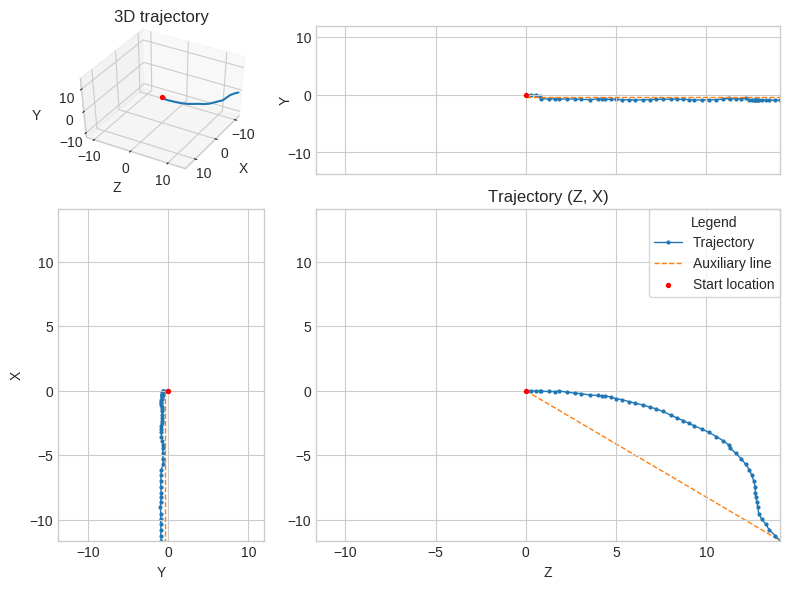

In [33]:
visualize_trajectory(trajectory)

Congrats on finishing this assignment!